In [1]:

import plot_functions
import compare_clusterings
import process_data
import visualizations

from compare_clusterings import *
from process_data import *
from plot_functions import *
from visualizations import *

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as p3
import matplotlib.animation as animation

In [3]:
import traj_generator

In [4]:
import numpy as np
import plotly.graph_objs as go

In [5]:

num_timesteps = 500  

num_particles_per_group = [
    (5, traj_generator.circular_motion, {'radius': 1, 'speed': 0.1, 'clockwise': True}),  
    (7, traj_generator.circular_motion, {'radius': 1, 'speed': 0.1, 'clockwise': False}),  
    (3, traj_generator.linear_motion, {'length': 2, 'speed': 0.1})     ,   
        (5, traj_generator.circular_motion, {'radius': 1.5, 'speed': 0.5, 'clockwise': True}),  
    (7, traj_generator.circular_motion, {'radius': 1.5, 'speed': 0.5,'clockwise': False}),  
    (3, traj_generator.linear_motion, {'length': 2, 'speed': 0.5, 'y_speed' : 0.2})                    
]


trajectories = traj_generator.generate_all_trajectories(num_particles_per_group, num_timesteps)

num_groups = len(num_particles_per_group)


In [6]:
len(trajectories)

30

In [7]:
num_timesteps = len(trajectories[0])
num_particles = len(trajectories)
groups_list = np.array(trajectories)[:,:,-1]
num_groups = len(np.unique(np.array(groups_list).flatten()))

In [8]:
trajectories

[[[1.3988166813009693, -0.1692795349955728, -0.25556992810343226, 1],
  [1.3938208465789952, -0.06944611834874465, -0.26529318696380394, 1],
  [1.3788832591422109, 0.029389795799488416, -0.2744202442462438, 1],
  [1.3541531704265752, 0.1262406716657668, -0.2911349385116695, 1],
  [1.3198776753038544, 0.22013880731307772, -0.32481361554773186, 1],
  [1.276399243191342, 0.3101460036086302, -0.2960362499199792, 1],
  [1.2241522962106475, 0.3953629383994627, -0.26709773350287114, 1],
  [1.1636588685854576, 0.4749381522421183, -0.3330791681554882, 1],
  [1.0955233906481348, 0.54807655590395, -0.3161536019921001, 1],
  [1.0204266495716336, 0.6140473746319106, -0.31007093780542283, 1],
  [0.939118987169109, 0.6721914498123237, -0.32799102782019013, 1],
  [0.8524128027265465, 0.7219278250658626, -0.24433130210925724, 1],
  [0.7611744357776427, 0.7627595509716536, -0.33726126368545045, 1],
  [0.6663155099255567, 0.7942786504216202, -0.30234304651285754, 1],
  [0.5687838242012101, 0.816170194992

In [9]:
plot_functions.plot_traj_labels_plotly(trajectories, num_particles_per_group)

In [10]:
%matplotlib notebook

a = plot_functions.plot_traj_labels_plt(trajectories, save_video=True, interval=100)

<IPython.core.display.Javascript object>

In [11]:
a

In [12]:
plt.show()

In [13]:
from IPython.display import HTML
HTML(a.to_html5_video())

In [14]:
#restructure for redpandda

In [15]:
import pandas as pd

In [16]:
flattened_data = []

for obj_id, particle_data in enumerate(trajectories):
    for t, record in enumerate(particle_data):
        
        flattened_data.append([obj_id, t] + record)

df = pd.DataFrame(flattened_data, columns=['obj_id', 't', 'x', 'y', 'z', 'label'])

print(df)

       obj_id    t         x         y         z  label
0           0    0  1.398817 -0.169280 -0.255570      1
1           0    1  1.393821 -0.069446 -0.265293      1
2           0    2  1.378883  0.029390 -0.274420      1
3           0    3  1.354153  0.126241 -0.291135      1
4           0    4  1.319878  0.220139 -0.324814      1
...       ...  ...       ...       ...       ...    ...
14995      29  495 -0.484131  0.211196  0.200552      6
14996      29  496 -0.984131  0.011196 -0.731725      6
14997      29  497 -0.484131 -0.188804  0.265808      6
14998      29  498  0.015869 -0.388804  1.253993      6
14999      29  499  0.515869 -0.588804  0.220067      6

[15000 rows x 6 columns]


In [17]:
import redpandda_general
res_hdbscan = redpandda_general.main_clustering_general(df, None, clustering_algorithm="hdbscan")

0.0115


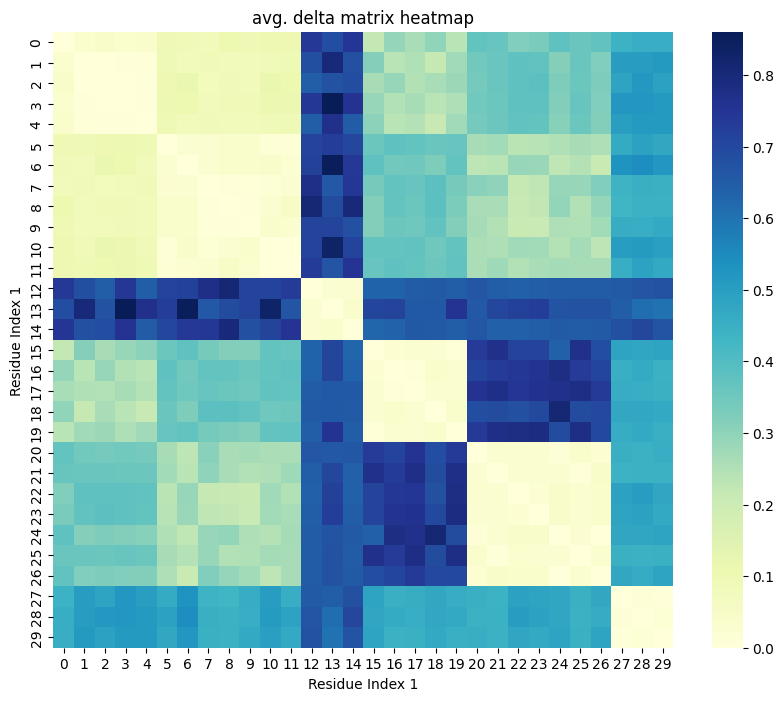

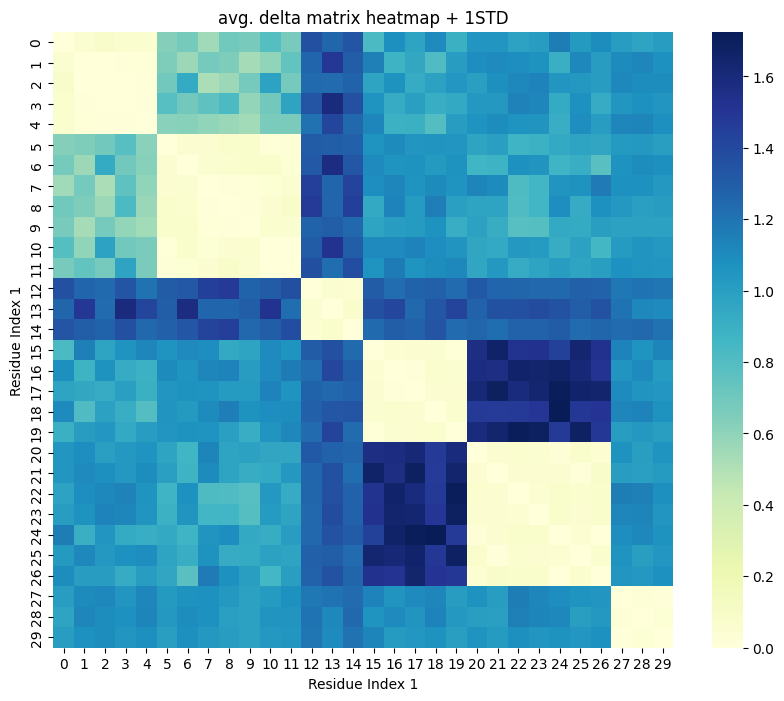

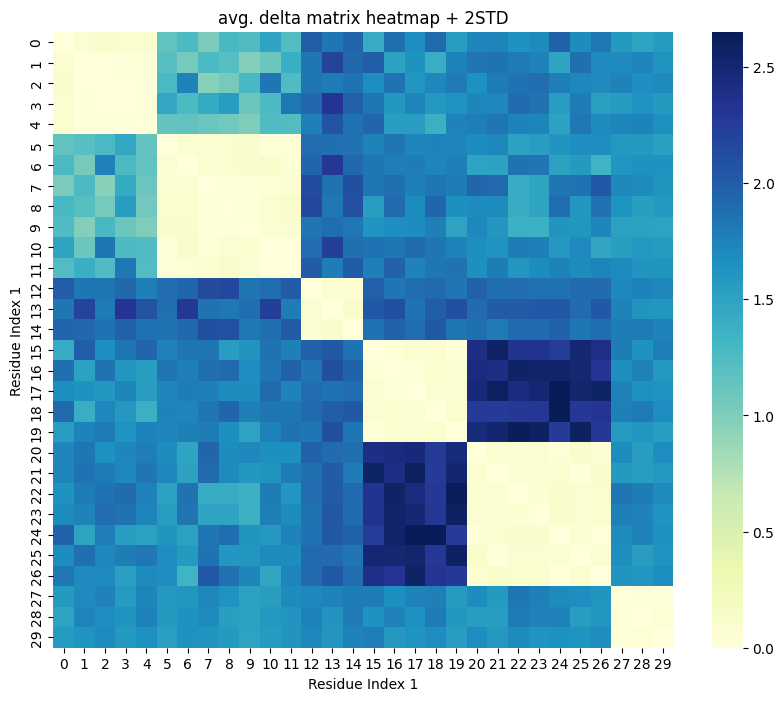

1.5099


In [18]:
%matplotlib inline

res_hdbscan_2std = redpandda_general.main_clustering_general_std(df, None, clustering_algorithm="hdbscan")

In [19]:
res_hdbscan_2std

(array([-1, -1, -1, -1, -1, -1, -1,  0,  0, -1, -1, -1,  0,  1,  0,  1,  1,
         1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1, -1, -1]),
 1.1263090829400582,
 array([[1.        , 0.96886427, 0.95400272, 0.96616643, 0.96469702,
         0.56435124, 0.52264954, 0.61560849, 0.51297259, 0.53080959,
         0.44053208, 0.53433475, 0.2490543 , 0.30621652, 0.27228067,
         0.4613003 , 0.2943226 , 0.36811492, 0.27847538, 0.41118419,
         0.35081719, 0.34610337, 0.38136461, 0.36259482, 0.26382317,
         0.36351801, 0.31449436, 0.40548712, 0.43708034, 0.40963331],
        [0.96886427, 1.        , 0.99720142, 0.99507344, 0.98921557,
         0.54555537, 0.60879455, 0.52029247, 0.53966002, 0.62983702,
         0.58233285, 0.47451525, 0.30885796, 0.17571228, 0.27636554,
         0.2529113 , 0.42825779, 0.38257755, 0.47197724, 0.34371401,
         0.30894627, 0.30233075, 0.3220963 , 0.33594989, 0.43702066,
         0.29654609, 0.3585504 , 0.35792743, 0.34378506, 0.38480981],
        [0.

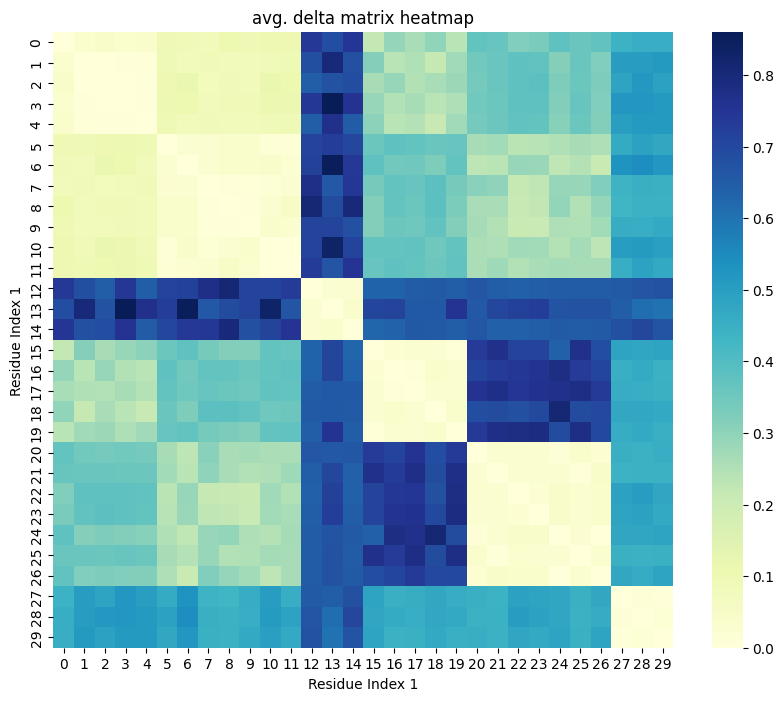

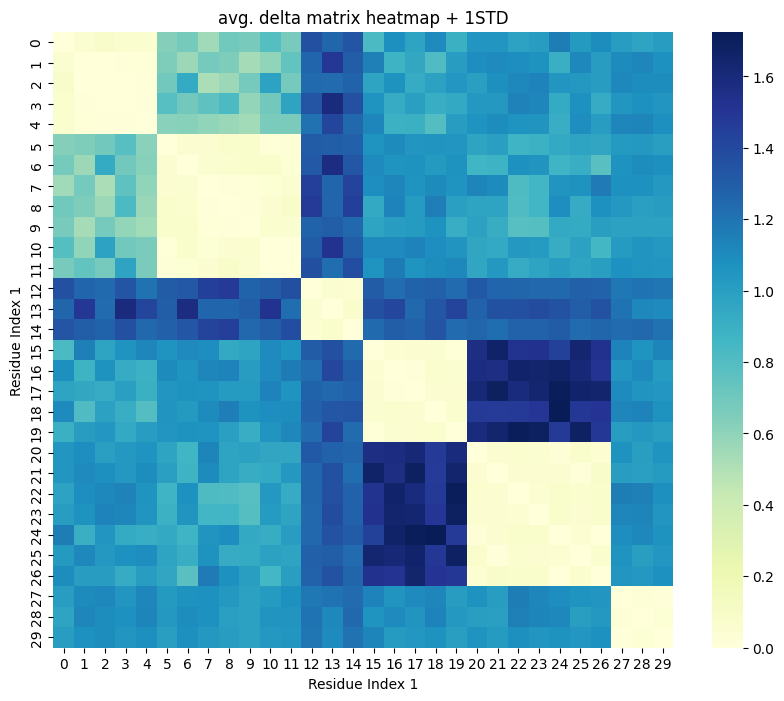

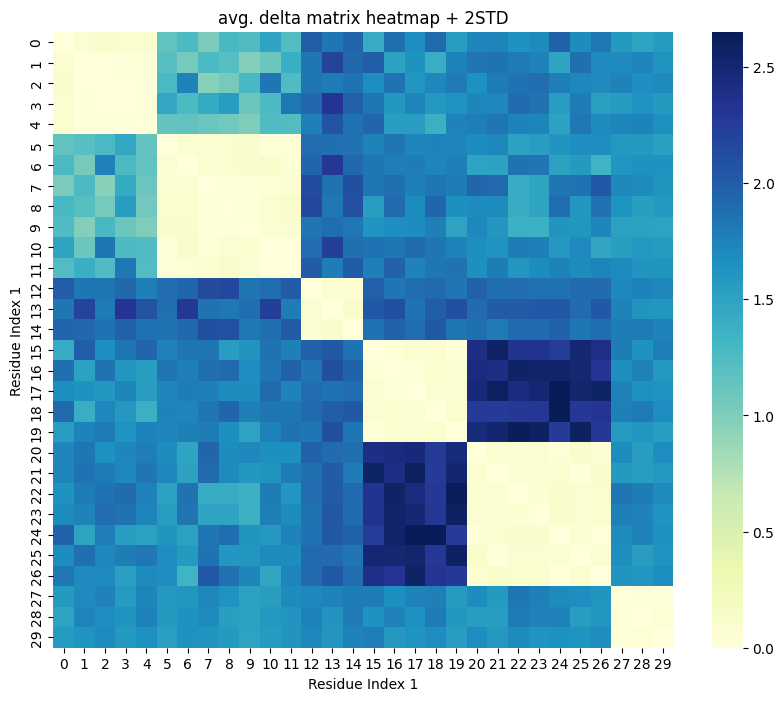

1.3236


In [20]:
res_specvar = redpandda_general.main_clustering_general_std(df, None)

In [21]:
import redpandda_general
res_hdbscan = redpandda_general.main_clustering_general(df, None, clustering_algorithm="hdbscan")

0.0029


In [22]:
res_hdbscan

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 2, 2, 2]),
 2.0812394639375635,
 array([[0.98081836, 0.98149668, 0.98185351, 0.98154086, 0.9816014 ,
         0.98303201, 0.98287784, 0.98268255, 0.983247  , 0.98300268,
         0.98312171, 0.98310483, 0.99732621, 0.99617032, 0.99745292,
         0.98573358, 0.98729947, 0.98659329, 0.98747447, 0.98610037,
         0.98908316, 0.98893011, 0.98801104, 0.98820918, 0.98921299,
         0.98888666, 0.9891463 , 0.99068247, 0.99100512, 0.99093725],
        [0.98149668, 0.98081836, 0.98087501, 0.98091757, 0.98104111,
         0.98298669, 0.98272175, 0.98285223, 0.98269961, 0.98273027,
         0.98278992, 0.98293982, 0.99606682, 0.99867434, 0.99596007,
         0.98785987, 0.98608735, 0.98642463, 0.98565959, 0.9868954 ,
         0.98853885, 0.98884957, 0.98925872, 0.98917553, 0.98780663,
         0.98887333, 0.98799906, 0.99202938, 0.99207596, 0.99222355],
        [0.98185351, 0.98087501, 0.980818

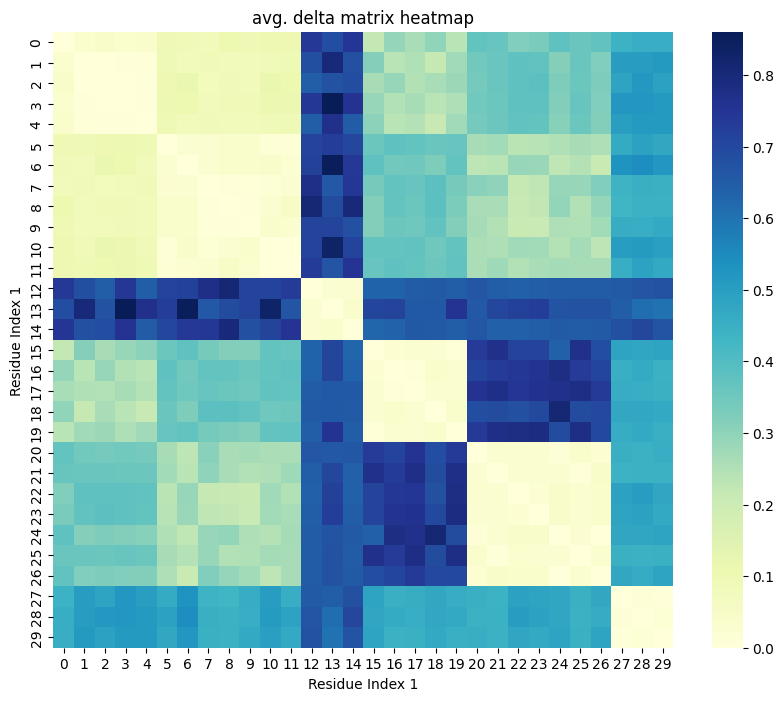

0.4565


In [23]:
res = redpandda_general.main_clustering_general(df, 2)

In [24]:
res_hdbscan = redpandda_general.main_clustering_general(df, None, clustering_algorithm="hdbscan", min_cluster_size=2, min_samples=1)

0.0024


In [25]:
res_hdbscan

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 2, 2, 2]),
 2.0812394639375635,
 array([[0.98081836, 0.98149668, 0.98185351, 0.98154086, 0.9816014 ,
         0.98303201, 0.98287784, 0.98268255, 0.983247  , 0.98300268,
         0.98312171, 0.98310483, 0.99732621, 0.99617032, 0.99745292,
         0.98573358, 0.98729947, 0.98659329, 0.98747447, 0.98610037,
         0.98908316, 0.98893011, 0.98801104, 0.98820918, 0.98921299,
         0.98888666, 0.9891463 , 0.99068247, 0.99100512, 0.99093725],
        [0.98149668, 0.98081836, 0.98087501, 0.98091757, 0.98104111,
         0.98298669, 0.98272175, 0.98285223, 0.98269961, 0.98273027,
         0.98278992, 0.98293982, 0.99606682, 0.99867434, 0.99596007,
         0.98785987, 0.98608735, 0.98642463, 0.98565959, 0.9868954 ,
         0.98853885, 0.98884957, 0.98925872, 0.98917553, 0.98780663,
         0.98887333, 0.98799906, 0.99202938, 0.99207596, 0.99222355],
        [0.98185351, 0.98087501, 0.980818

In [26]:
res

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1]),
 2.5536874192533863,
 [],
 [array([[ 0],
         [ 1],
         [ 2],
         [ 3],
         [ 4],
         [ 5],
         [ 6],
         [ 7],
         [ 8],
         [ 9],
         [10],
         [11],
         [12],
         [13],
         [14],
         [15],
         [16],
         [17],
         [18],
         [19],
         [20],
         [21],
         [22],
         [23],
         [24],
         [25],
         [26],
         [27],
         [28],
         [29]]),
  array([[ 0],
         [ 1],
         [ 2],
         [ 3],
         [ 4],
         [ 5],
         [ 6],
         [ 7],
         [ 8],
         [ 9],
         [10],
         [11],
         [12],
         [13],
         [14],
         [15],
         [16],
         [17],
         [18],
         [19],
         [20],
         [21],
         [22],
         [23],
         [24],
         [25],
         [26],
         

In [27]:
res_agglon = redpandda_general.main_clustering_general(df, None, clustering_algorithm="agglomerative")

something wrong with clustering Q computation


In [28]:
res_agglon

(array([2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 5, 5, 5, 4, 4, 4, 4, 4, 1, 1,
        1, 1, 1, 1, 1, 3, 3, 3]),
 [],
 array([[0.        , 0.03536306, 0.05396577, 0.03766621, 0.04082224,
         0.11540431, 0.10736688, 0.09718582, 0.12661252, 0.11387521,
         0.1200807 , 0.11920097, 0.86060675, 0.80034678, 0.86721268,
         0.25624615, 0.33788065, 0.30106525, 0.34700399, 0.27536768,
         0.43087012, 0.42289118, 0.37497724, 0.3853071 , 0.43763857,
         0.42062591, 0.43416172, 0.51424757, 0.53106809, 0.5275298 ],
        [0.03536306, 0.        , 0.00295322, 0.00517182, 0.01161265,
         0.11304206, 0.0992298 , 0.10603193, 0.09807532, 0.09967386,
         0.10278348, 0.11059819, 0.79495057, 0.93088905, 0.78938559,
         0.36709621, 0.27468901, 0.29227283, 0.25238888, 0.31681555,
         0.40249368, 0.41869245, 0.44002279, 0.43568572, 0.36432065,
         0.41993127, 0.37435266, 0.5844661 , 0.58689438, 0.59458865],
        [0.05396577, 0.00295322, 0.        , 0.00146717, 

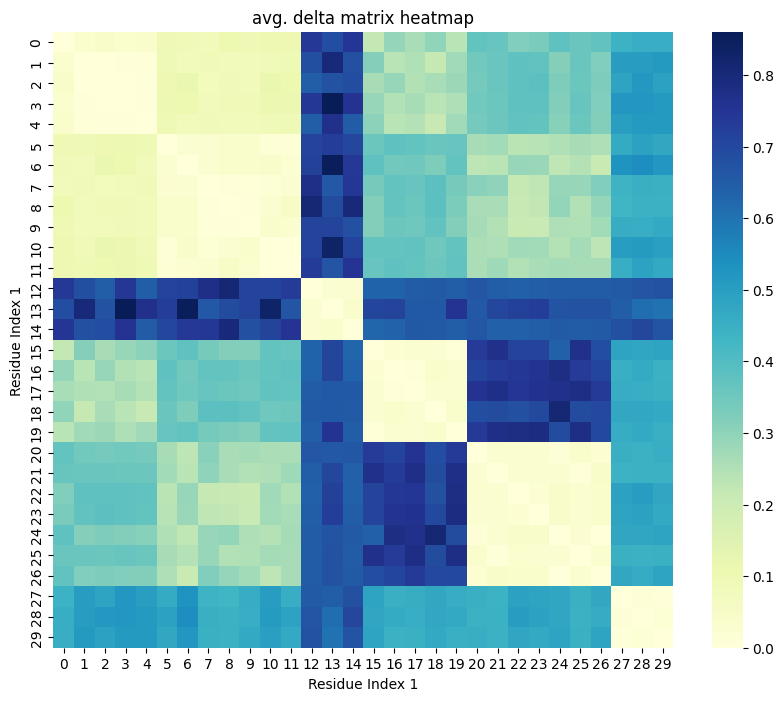

0.4733


In [29]:
res = redpandda_general.main_clustering_general(df, 6)

In [30]:
res_hdbscan = redpandda_general.main_clustering_general(df, None, clustering_algorithm="hdbscan")

0.0027


In [31]:
res_hdbscan

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 2, 2, 2]),
 2.0812394639375635,
 array([[0.98081836, 0.98149668, 0.98185351, 0.98154086, 0.9816014 ,
         0.98303201, 0.98287784, 0.98268255, 0.983247  , 0.98300268,
         0.98312171, 0.98310483, 0.99732621, 0.99617032, 0.99745292,
         0.98573358, 0.98729947, 0.98659329, 0.98747447, 0.98610037,
         0.98908316, 0.98893011, 0.98801104, 0.98820918, 0.98921299,
         0.98888666, 0.9891463 , 0.99068247, 0.99100512, 0.99093725],
        [0.98149668, 0.98081836, 0.98087501, 0.98091757, 0.98104111,
         0.98298669, 0.98272175, 0.98285223, 0.98269961, 0.98273027,
         0.98278992, 0.98293982, 0.99606682, 0.99867434, 0.99596007,
         0.98785987, 0.98608735, 0.98642463, 0.98565959, 0.9868954 ,
         0.98853885, 0.98884957, 0.98925872, 0.98917553, 0.98780663,
         0.98887333, 0.98799906, 0.99202938, 0.99207596, 0.99222355],
        [0.98185351, 0.98087501, 0.980818

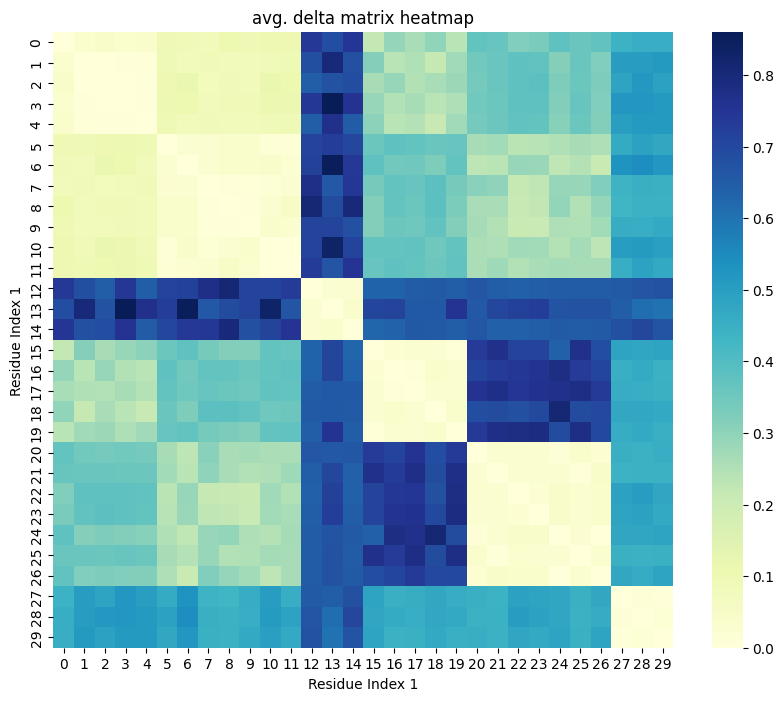

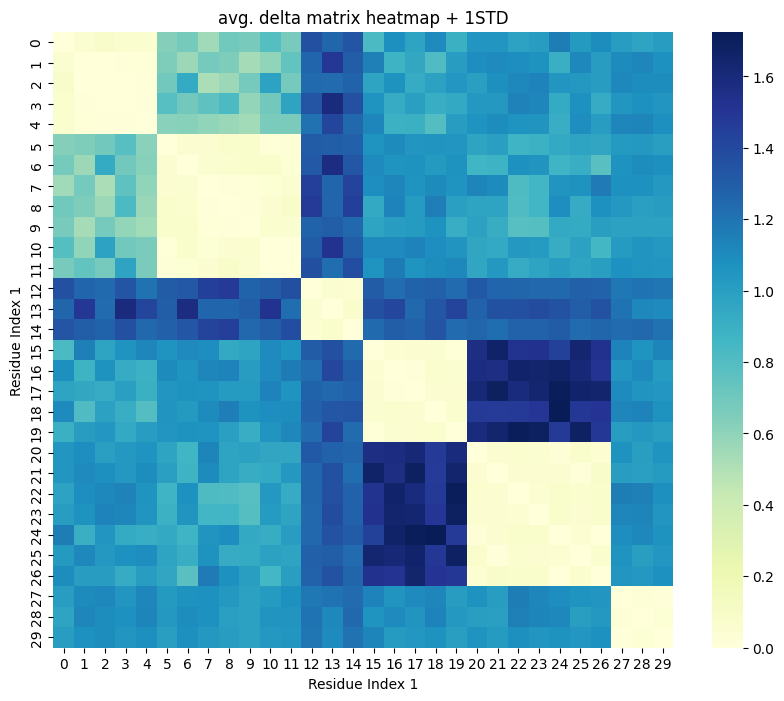

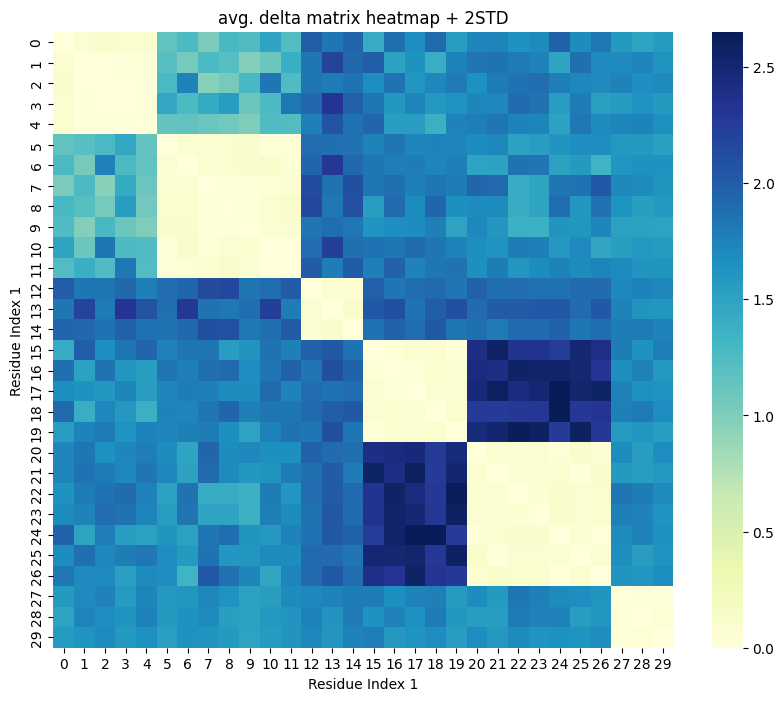

1.4369


In [32]:
res_specvar = redpandda_general.main_clustering_general_std(df, None)

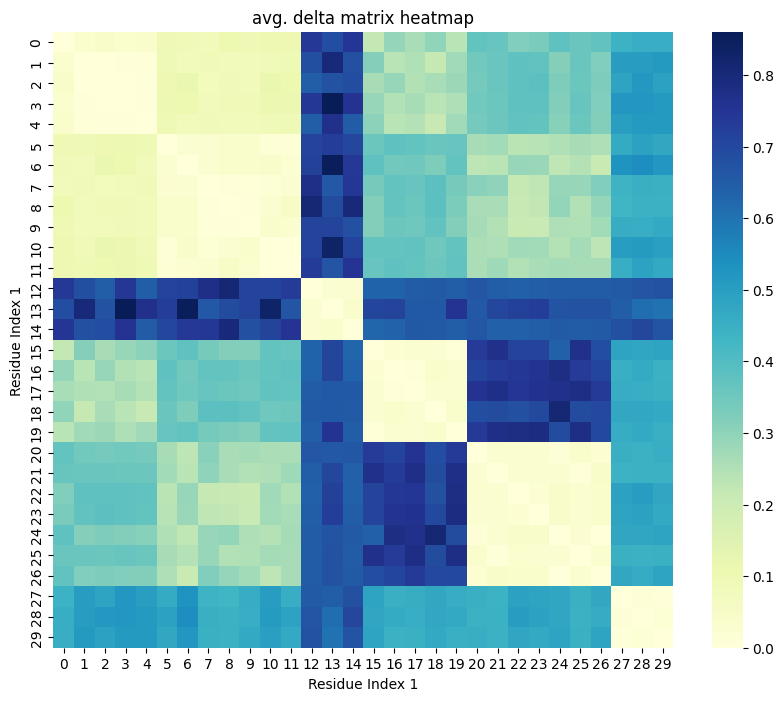

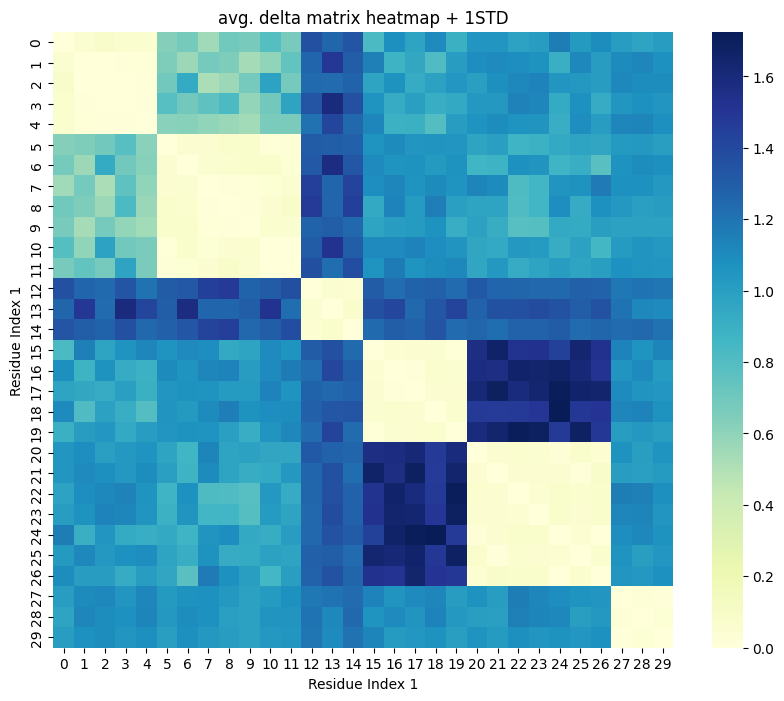

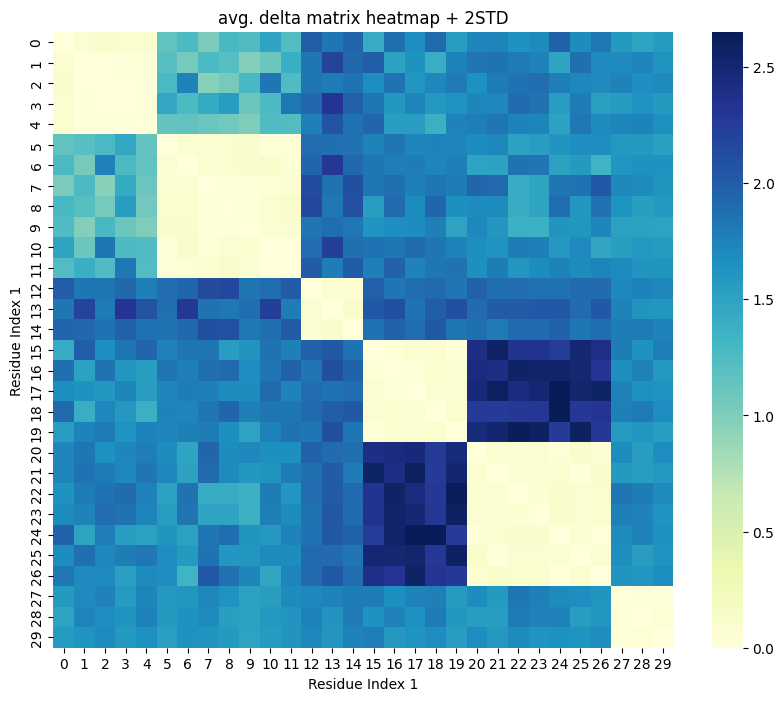

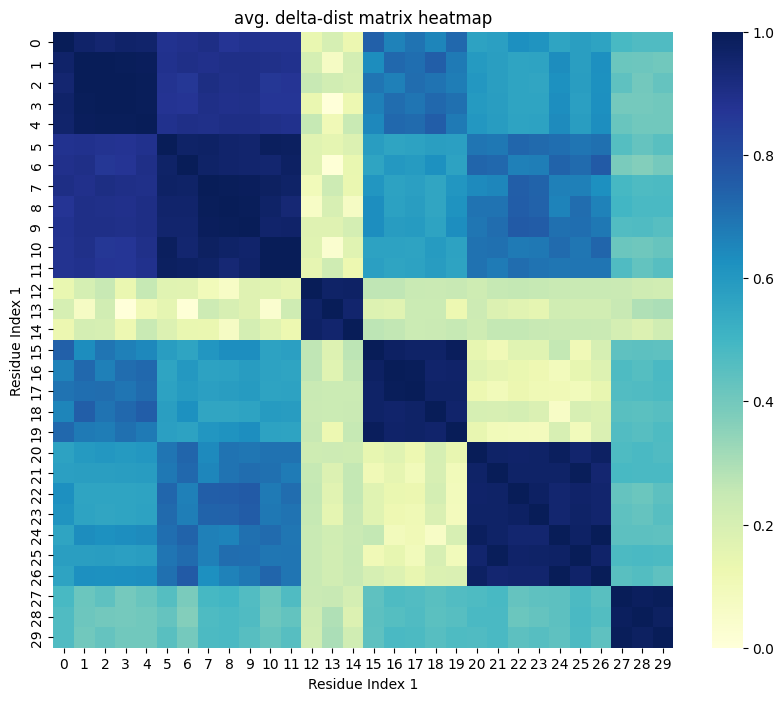

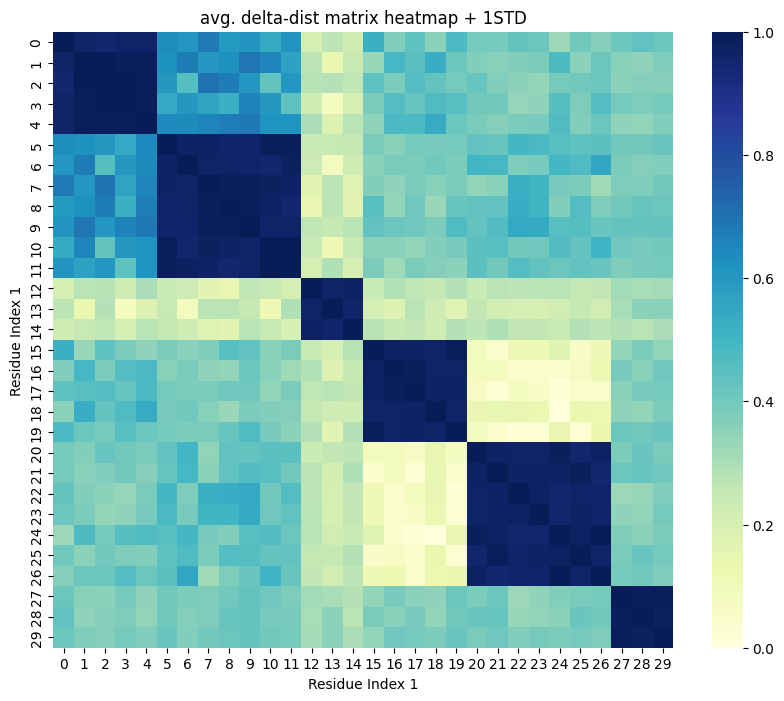

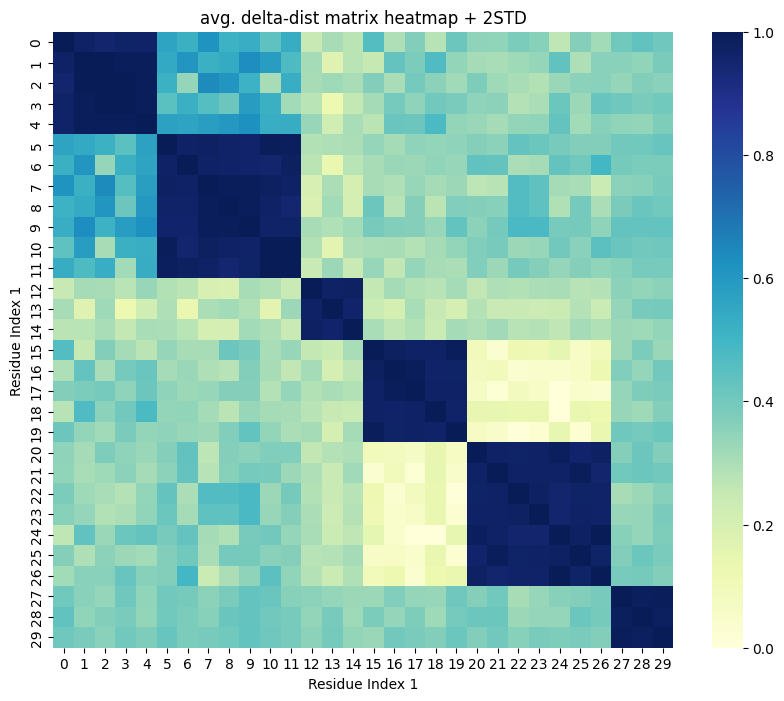

2.9416


In [33]:
res_specvar_distance = redpandda_general.main_clustering_general_std_distance(df, None)

In [34]:
result_labels = res[0]

In [35]:
result_labels

array([3, 3, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 4, 4, 4, 4, 4, 2, 2,
       2, 2, 2, 2, 2, 5, 5, 5])

In [36]:
trajectories_results = []
for ip, particle_traj in enumerate(trajectories):
    trajectory_result = []

    for it, timestep in enumerate(particle_traj):
        trajectory_result.append([*timestep[:-1], result_labels[ip]])
    trajectories_results.append(trajectory_result)

In [37]:
trajectories_results = [
    [[*timestep[:-1], result_labels[ip]] for timestep in particle_traj]
    for ip, particle_traj in enumerate(trajectories)
]

In [38]:
traj_array, point_array, frames_count, n_objects = redpandda_general.prepare_data_from_df(df)

In [39]:
dist_matrices = redpandda_general.get_distance_matrices(traj_array)
delta_matrices = redpandda_general.get_delta_matrices(dist_matrices)
average_delta_matrix = redpandda_general.calculate_average_delta_matrix(delta_matrices)

std_delta_matrix = redpandda_general.get_std_matrices(dist_matrices)

In [40]:
std_delta_matrix

array([[0.        , 0.02607724, 0.03778281, 0.02866418, 0.02925504,
        0.52810414, 0.58686697, 0.46796534, 0.59142011, 0.57324493,
        0.69030092, 0.56627846, 0.62562794, 0.57574627, 0.59198296,
        0.6041731 , 0.79049551, 0.70847204, 0.80758676, 0.66241   ,
        0.67556385, 0.68524824, 0.65909977, 0.67954782, 0.78802308,
        0.66312761, 0.72231894, 0.56718762, 0.51805173, 0.55597429],
       [0.02607724, 0.        , 0.00244085, 0.00430843, 0.00930597,
        0.55404755, 0.47612256, 0.59056727, 0.56830538, 0.44802501,
        0.50968706, 0.64931233, 0.57456491, 0.69265513, 0.62005063,
        0.83284515, 0.640059  , 0.69307465, 0.59167294, 0.73405594,
        0.74330194, 0.74510593, 0.70971554, 0.69320894, 0.58987379,
        0.75224453, 0.68962466, 0.60004976, 0.61776059, 0.56004317],
       [0.03778281, 0.00244085, 0.        , 0.00128355, 0.0048596 ,
        0.58972372, 0.81846128, 0.436754  , 0.47462804, 0.60024292,
        0.86354732, 0.57166377, 0.5955788 , 0.

In [41]:
summed_delta_matrix = average_delta_matrix

In [42]:
summed_delta_matrix_1std = summed_delta_matrix + std_delta_matrix 
summed_delta_matrix_2std = summed_delta_matrix + std_delta_matrix * 2

In [43]:
from distance_matrix import *

In [44]:
normed_delta_matrix = 1 - normed_values(summed_delta_matrix)
normed_delta_matrix_1std = 1 - normed_values(summed_delta_matrix_1std)
normed_delta_matrix_2std = 1 - normed_values(summed_delta_matrix_2std)

In [45]:
normed_similarity_matrix = 1 - normed_values(summed_delta_matrix)
normed_similarity_matrix_1std = 1 - normed_values(summed_delta_matrix_1std)
normed_similarity_matrix_2std = 1 - normed_values(summed_delta_matrix_2std)

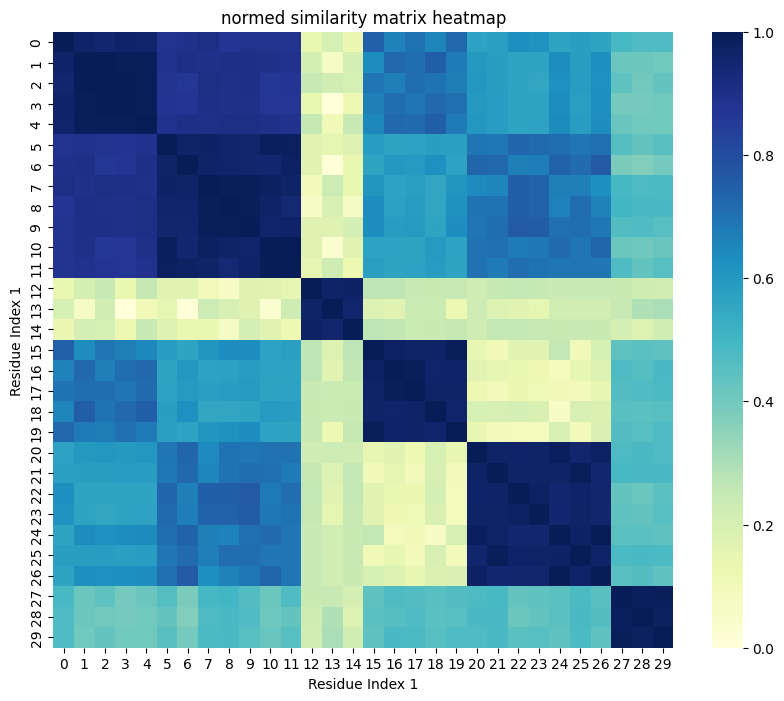

In [46]:
create_delta_heatmap(normed_similarity_matrix, title="normed similarity matrix heatmap")

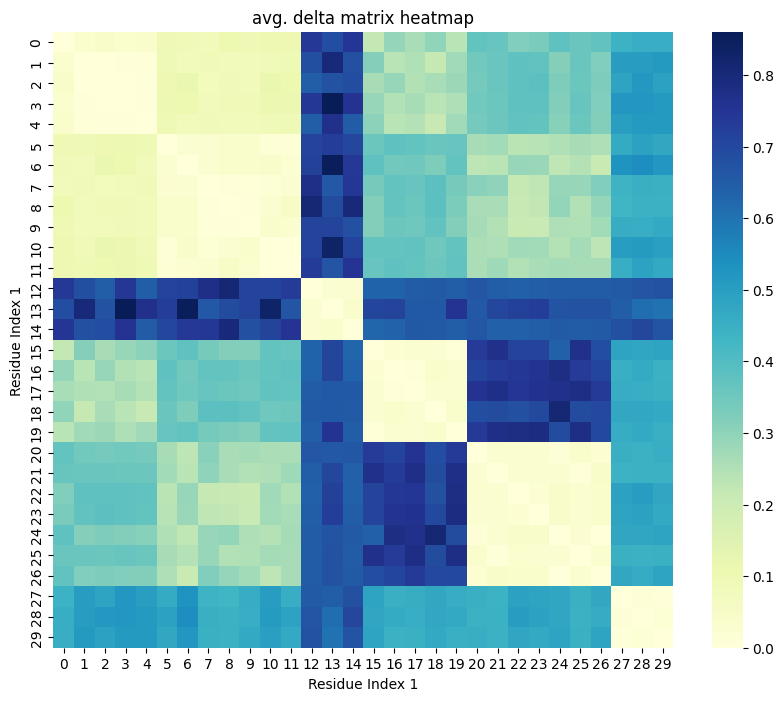

In [47]:
import distance_matrix
distance_matrix.create_delta_heatmap(average_delta_matrix, title="avg. delta matrix heatmap")

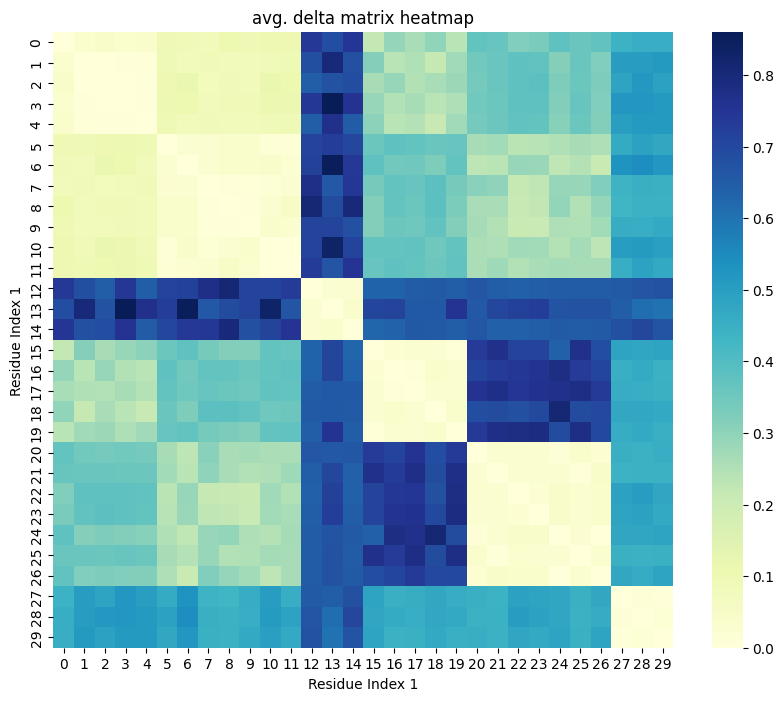

0.4263


array([2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 5, 5, 5, 1, 1, 1, 1, 1, 3, 3,
       3, 3, 3, 3, 3, 4, 4, 4])

In [48]:
spectral_clustering_on_deltas(average_delta_matrix, 6)

In [49]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed')
result = clustering.fit(normed_similarity_matrix)

In [50]:
result.labels_

array([5, 5, 5, 5, 5, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 4, 4, 4], dtype=int32)

In [51]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed')
result = clustering.fit(summed_delta_matrix_2std)
print(result.labels_)

[3 5 2 1 5 0 2 5 1 0 2 1 4 0 3 0 3 0 3 2 4 0 2 2 3 4 0 0 3 4]


In [52]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=4, min_samples=2, metric='precomputed') 

result = clustering.fit(summed_delta_matrix.astype(np.float64))

print(result.labels_)

[ 2  2  2  2  2  3  3  3  3  3  3  3 -1 -1 -1  0  0  0  0  0  1  1  1  1
  1  1  1 -1 -1 -1]


In [53]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=4, min_samples=2, metric='precomputed') 


result = clustering.fit(summed_delta_matrix_1std.astype(np.float64))

print(result.labels_)

[ 2  2  2  2  2  3  3  3  3  3  3  3 -1 -1 -1  0  0  0  0  0  1  1  1  1
  1  1  1 -1 -1 -1]


In [54]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2, metric='precomputed') 


result = clustering.fit(summed_delta_matrix_2std.astype(np.float64))

print(result.labels_)

[4 4 4 4 4 5 5 5 5 5 5 5 0 0 0 2 2 2 2 2 3 3 3 3 3 3 3 1 1 1]


In [55]:
normed_delta_matrix = normed_values(summed_delta_matrix)
normed_delta_matrix_1std = normed_values(summed_delta_matrix_1std)
normed_delta_matrix_2std =  normed_values(summed_delta_matrix_2std)

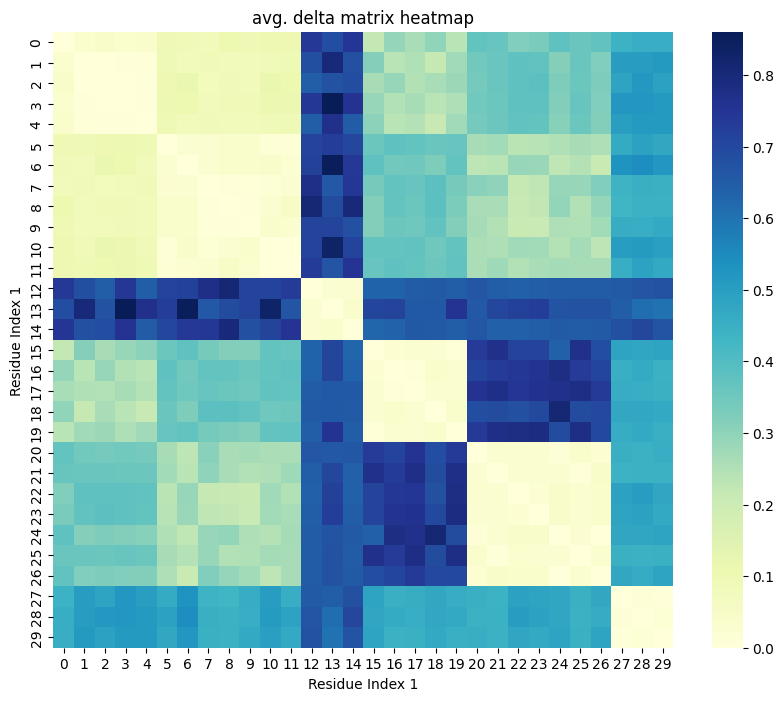

0.4479


array([5, 5, 5, 5, 5, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 2, 2, 2, 2, 2, 3, 3,
       3, 3, 3, 3, 3, 1, 1, 1])

In [56]:
spectral_clustering_on_deltas(average_delta_matrix, 6)

In [57]:
clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=0.1, affinity='precomputed', linkage='complete')

result = clustering.fit(average_delta_matrix)

In [58]:

clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=0.7, metric='precomputed', linkage='complete')

result = clustering.fit(summed_delta_matrix_2std)

In [59]:
result.labels_

array([1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 3, 3, 3, 3, 3, 4, 4,
       4, 4, 4, 4, 4, 5, 5, 5])

In [60]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2, metric='precomputed') 


result = clustering.fit(summed_delta_matrix_2std.astype(np.float64))

print(result.labels_)

[4 4 4 4 4 5 5 5 5 5 5 5 0 0 0 2 2 2 2 2 3 3 3 3 3 3 3 1 1 1]


In [61]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2, metric='precomputed') 


result = clustering.fit(summed_delta_matrix.astype(np.float64))

print(result.labels_)

[4 4 4 4 4 5 5 5 5 5 5 5 0 0 0 2 2 2 2 2 3 3 3 3 3 3 3 1 1 1]


In [62]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2, metric='precomputed') 


result = clustering.fit(normed_delta_matrix_2std.astype(np.float64))

print(result.labels_)

[4 4 4 4 4 5 5 5 5 5 5 5 0 0 0 2 2 2 2 2 3 3 3 3 3 3 3 1 1 1]


In [63]:
#FF

In [64]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed')
result_spectral_6 = clustering.fit(normed_similarity_matrix)

clustering = SpectralClustering(n_clusters=3, affinity='precomputed')
result_spectral_3 = clustering.fit(normed_similarity_matrix)

In [65]:
clustering = SpectralClustering(n_clusters=4, affinity='precomputed')
result_spectral_4 = clustering.fit(normed_similarity_matrix)

In [66]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed', assign_labels="discretize")
result_spectral_6_discr = clustering.fit(normed_similarity_matrix)

In [67]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed', assign_labels="discretize")
result_spectral_6_discr = clustering.fit(normed_similarity_matrix)
result_spectral_6_discr.labels_

array([0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 2, 2, 2, 2, 2, 3, 3,
       3, 3, 3, 3, 3, 1, 1, 1])

In [68]:
clustering = SpectralClustering(n_clusters=3, affinity='precomputed', assign_labels="discretize")
result_spectral_3_discr = clustering.fit(normed_similarity_matrix)
result_spectral_3_discr.labels_

array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 0])

In [69]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed', assign_labels="cluster_qr")
result_spectral_6_discr = clustering.fit(normed_similarity_matrix)
result_spectral_6_discr.labels_

array([3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 0, 0, 0, 2, 2, 2, 2, 2, 5, 5,
       5, 5, 5, 5, 5, 1, 1, 1])

In [70]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed')
result_spectral_6_discr = clustering.fit(normed_similarity_matrix)
result_spectral_6_discr.labels_

array([5, 5, 5, 5, 5, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 4, 4, 4], dtype=int32)

In [71]:
result_spectral_3.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2,
       2, 2, 2, 2, 2, 0, 0, 0], dtype=int32)

In [72]:
result_spectral_6.labels_

array([5, 5, 5, 5, 5, 0, 0, 0, 0, 0, 0, 0, 3, 3, 3, 4, 4, 4, 4, 4, 1, 1,
       1, 1, 1, 1, 1, 2, 2, 2], dtype=int32)

In [73]:
result_spectral_6_discr.labels_

array([5, 5, 5, 5, 5, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 4, 4, 4], dtype=int32)

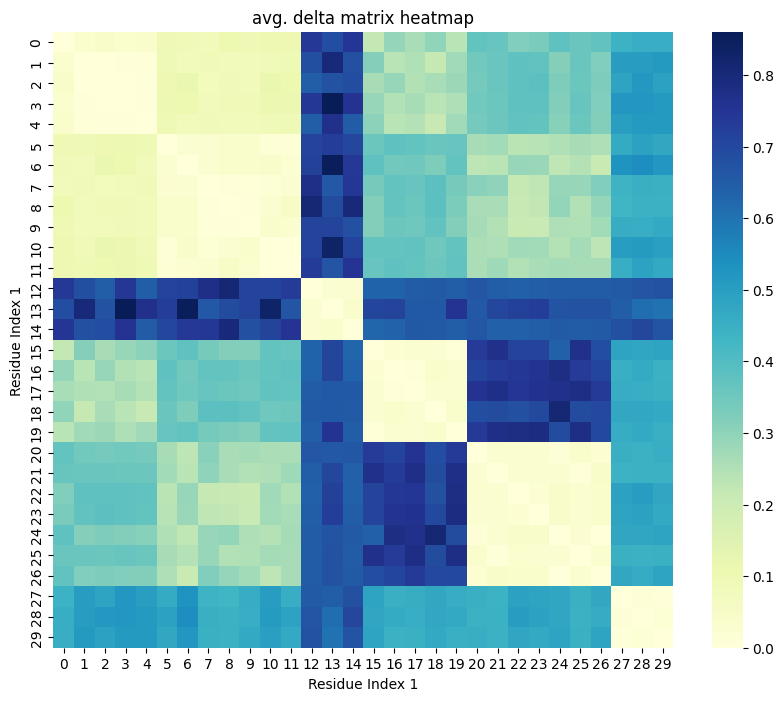

0.4279


array([3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 5, 5, 5, 0, 0, 0, 0, 0, 4, 4,
       4, 4, 4, 4, 4, 2, 2, 2])

In [74]:
distance_matrix.spectral_clustering_on_deltas(summed_delta_matrix, 6)

In [75]:
normed_similarity_matrix = 1 - normed_values(summed_delta_matrix)


In [76]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed')
result = clustering.fit(summed_delta_matrix_2std)
print(result.labels_)

[2 0 1 3 0 0 1 0 3 4 1 3 5 4 0 4 0 4 2 0 5 4 1 1 2 5 4 4 0 5]


In [77]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=4, min_samples=2, metric='precomputed') 

result_hdbscan_4_2 = clustering.fit(summed_delta_matrix.astype(np.float64))

print(result_hdbscan_4_2.labels_)

[ 2  2  2  2  2  3  3  3  3  3  3  3 -1 -1 -1  0  0  0  0  0  1  1  1  1
  1  1  1 -1 -1 -1]


In [78]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=4, min_samples=2, metric='precomputed') 


result_hdbscan_4_2_1std = clustering.fit(summed_delta_matrix_1std.astype(np.float64))

print(result_hdbscan_4_2_1std.labels_)

[ 2  2  2  2  2  3  3  3  3  3  3  3 -1 -1 -1  0  0  0  0  0  1  1  1  1
  1  1  1 -1 -1 -1]


In [79]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2, metric='precomputed') 


result_hdbscan_2_2_2std = clustering.fit(summed_delta_matrix_2std.astype(np.float64))

print(result_hdbscan_2_2_2std.labels_)

[4 4 4 4 4 5 5 5 5 5 5 5 0 0 0 2 2 2 2 2 3 3 3 3 3 3 3 1 1 1]


In [80]:
normed_delta_matrix = normed_values(summed_delta_matrix)
normed_delta_matrix_1std = normed_values(summed_delta_matrix_1std)
normed_delta_matrix_2std =  normed_values(summed_delta_matrix_2std)

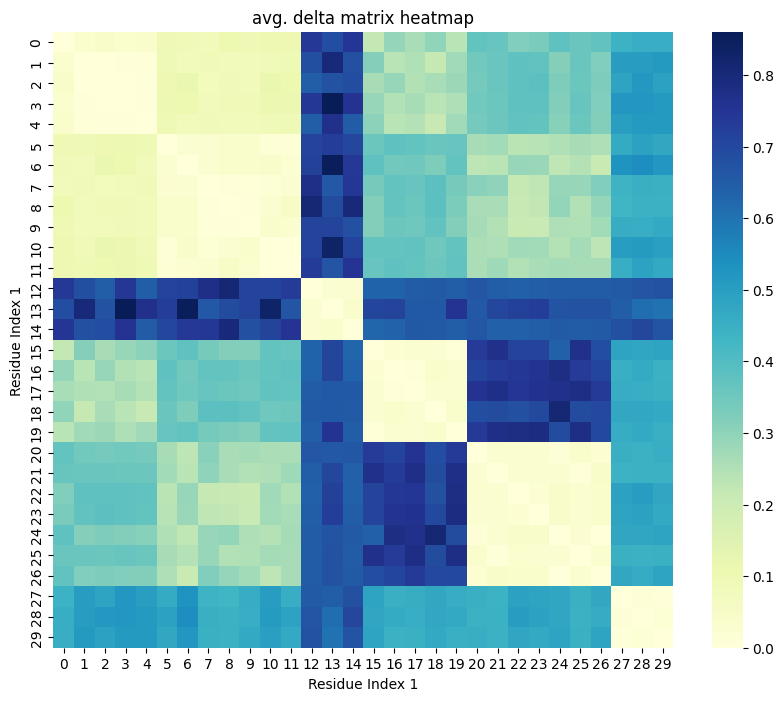

0.5233


array([5, 5, 5, 5, 5, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 2, 2, 2])

In [81]:
spectral_clustering_on_deltas(average_delta_matrix, 6)

In [82]:
clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=0.1, affinity='precomputed', linkage='complete')

result_agglo_compl_dt01 = clustering.fit(average_delta_matrix)

In [83]:

clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=0.7, metric='precomputed', linkage='complete')

result_agglo_compl_dt07_2std  = clustering.fit(summed_delta_matrix_2std)

In [84]:

clustering = AgglomerativeClustering(n_clusters=3, metric='precomputed', linkage='complete')

result_agglo_cl3  = clustering.fit(average_delta_matrix)

In [85]:
result_agglo_compl_dt01.labels_

array([2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 5, 5, 5, 4, 4, 4, 4, 4, 1, 1,
       1, 1, 1, 1, 1, 3, 3, 3])

In [86]:
result_agglo_cl3.labels_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 0])

In [87]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2, metric='precomputed') 


result_hdbscan_2_2 = clustering.fit(summed_delta_matrix.astype(np.float64))

print(result_hdbscan_2_2.labels_)

[4 4 4 4 4 5 5 5 5 5 5 5 0 0 0 2 2 2 2 2 3 3 3 3 3 3 3 1 1 1]


In [88]:
result_hdbscan_2_2_2std.labels_

array([4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 0, 0, 0, 2, 2, 2, 2, 2, 3, 3,
       3, 3, 3, 3, 3, 1, 1, 1])

In [89]:
groups_list = np.array(trajectories)[:,:,-1]
num_groups = len(np.unique(np.array(groups_list).flatten()))

In [90]:
true_labels = groups_list[:,0]

In [91]:
true_labels

array([1., 1., 1., 1., 1., 2., 2., 2., 2., 2., 2., 2., 3., 3., 3., 4., 4.,
       4., 4., 4., 5., 5., 5., 5., 5., 5., 5., 6., 6., 6.])

In [92]:
residue_items = list(range(len(true_labels)))

In [93]:
import visualizations


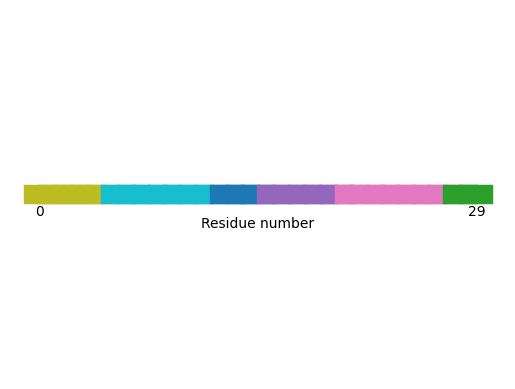

In [94]:
visualizations.plot_residue_line_plus_noise(residue_items, result_hdbscan_2_2.labels_)

In [95]:
from sklearn.cluster import AffinityPropagation

In [96]:
clustering_aff = AffinityPropagation(random_state=5, affinity="precomputed").fit(normed_similarity_matrix.astype(np.float64))
clustering_aff_1std = AffinityPropagation(random_state=5, affinity="precomputed").fit(normed_similarity_matrix_1std.astype(np.float64))
clustering_aff_2std = AffinityPropagation(random_state=5, affinity="precomputed").fit(normed_similarity_matrix_2std.astype(np.float64))

In [97]:
clustering.labels_

array([4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 0, 0, 0, 2, 2, 2, 2, 2, 3, 3,
       3, 3, 3, 3, 3, 1, 1, 1])

In [98]:
clustering_aff_1std.labels_

array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 3, 3, 3, 3, 3, 4, 4,
       4, 4, 4, 4, 4, 5, 5, 5])

In [99]:
clustering_aff_2std.labels_

array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 3, 3, 3, 3, 3, 4, 4,
       4, 4, 4, 4, 4, 5, 5, 5])

In [100]:
res_hdbscan_2_1 = redpandda_general.main_clustering_general(df, None, clustering_algorithm="hdbscan", min_cluster_size=2, min_samples=1)

0.0022


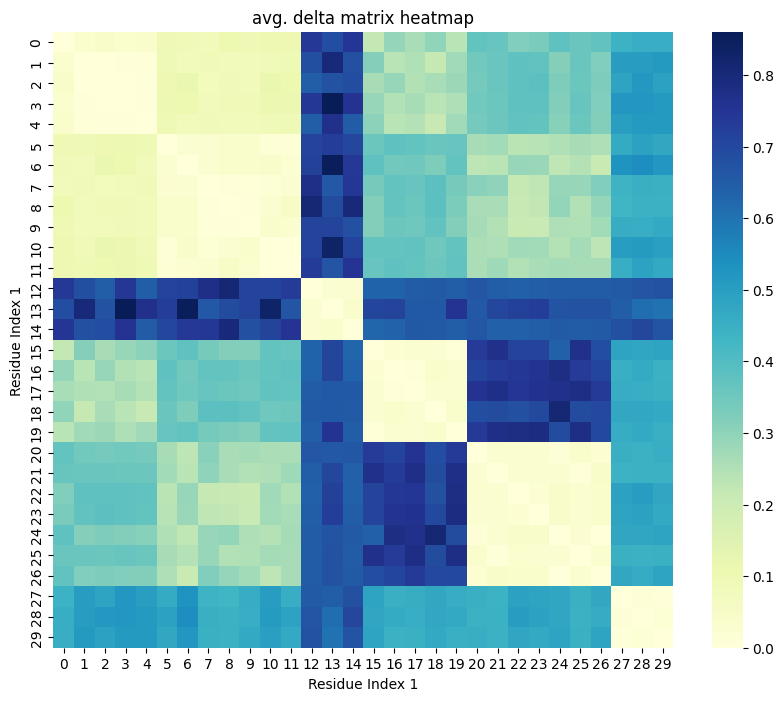

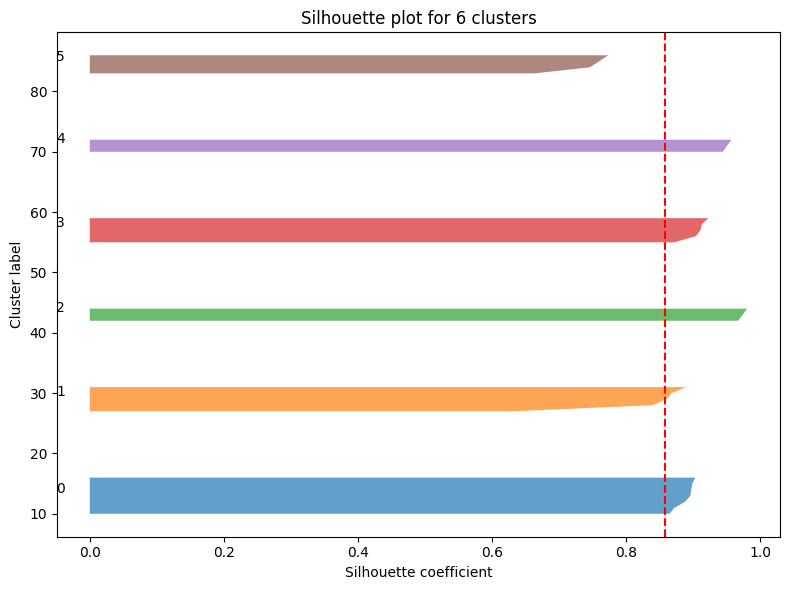

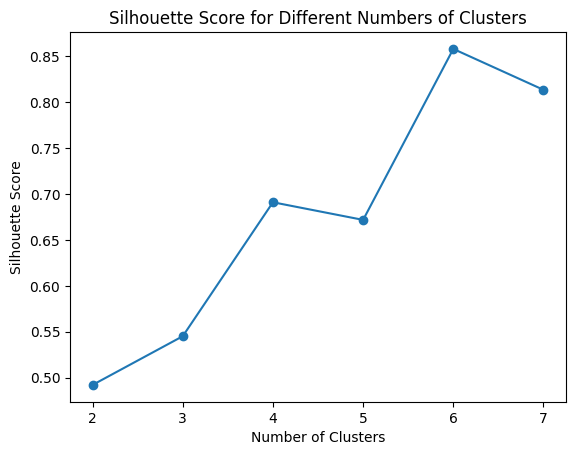

1.0204


In [101]:
spectral_opt_sil = distance_matrix.spectral_clustering_on_deltas(summed_delta_matrix, cluster_count=None, silhouette = True)
spectral_opt_sil = list(spectral_opt_sil)


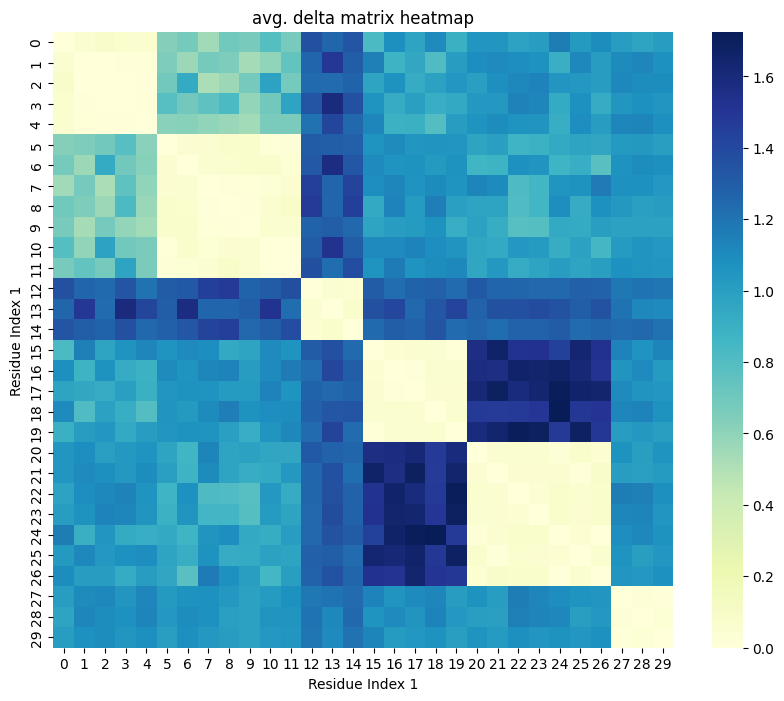

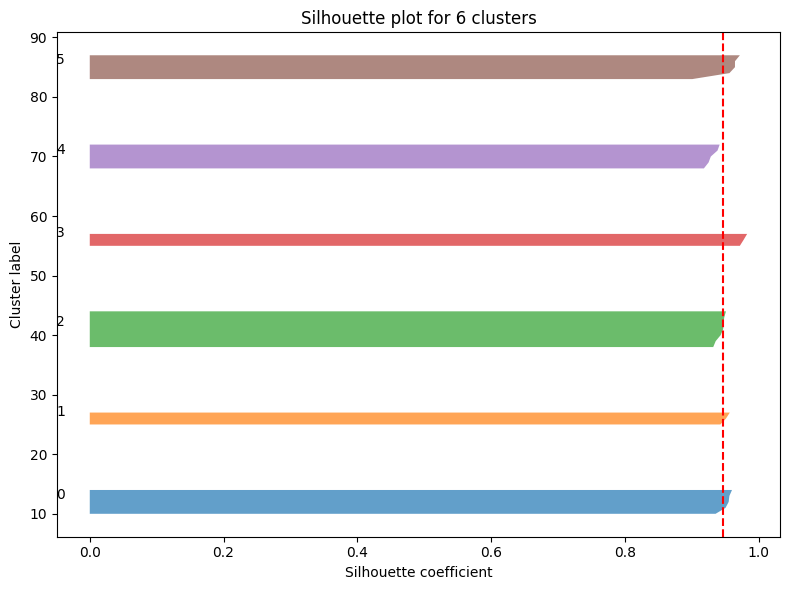

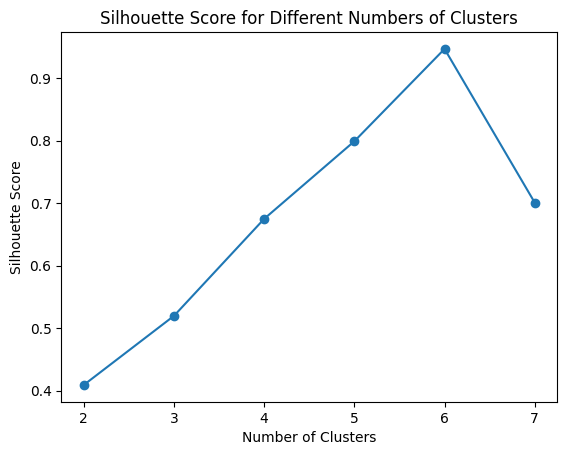

0.8238


In [102]:
spectral_opt_sil_1std = distance_matrix.spectral_clustering_on_deltas(summed_delta_matrix_1std, cluster_count=None, silhouette = True)
spectral_opt_sil_1std = list(spectral_opt_sil_1std)

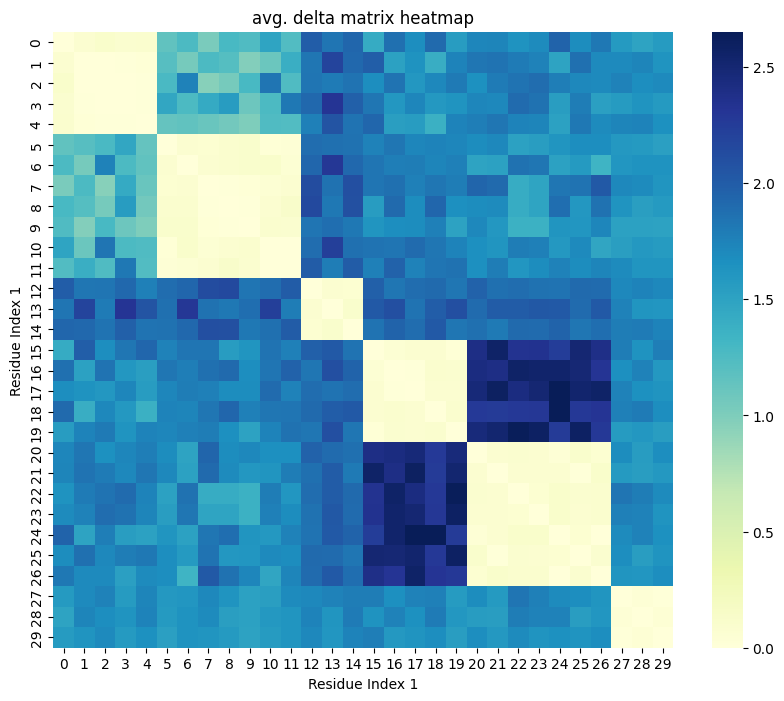

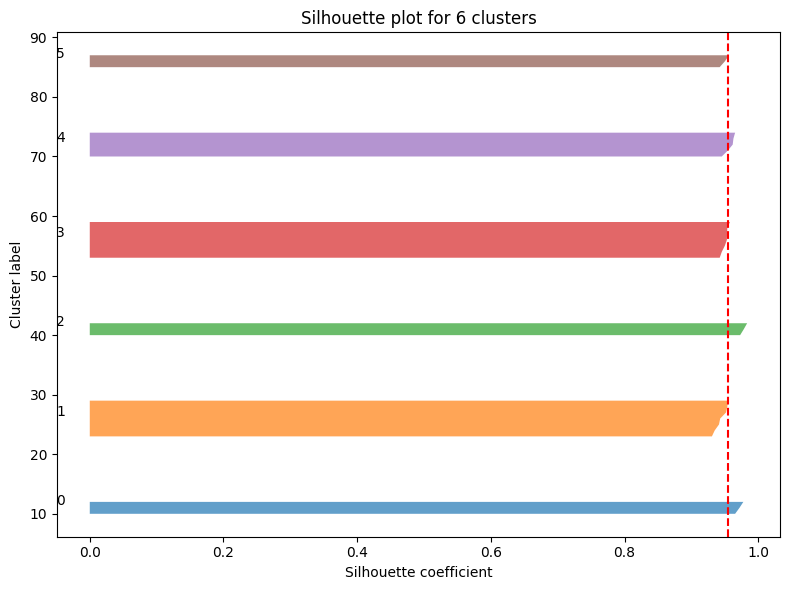

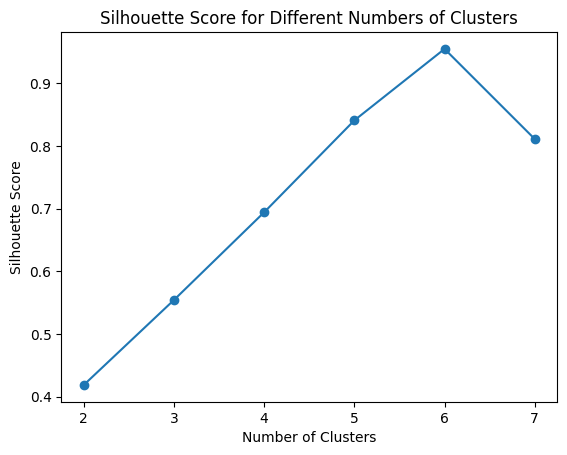

0.7834


In [103]:
spectral_opt_sil_2std = distance_matrix.spectral_clustering_on_deltas(summed_delta_matrix_2std, cluster_count=None, silhouette = True)
spectral_opt_sil_2std = list(spectral_opt_sil_2std)

In [104]:
clustering_names = []
clustering_results = []

clustering_names.append("hdbscan, min_cluster:2, min_samples:1")
clustering_results.append(list(res_hdbscan_2_1[0]))
clustering_names.append("hdbscan, +2std, min_cluster:2, min_samples:1")
clustering_results.append(list(res_hdbscan_2std[0]))

clustering_names.append("hdbscan, min_cluster:2, min_samples:2")
clustering_results.append(list(result_hdbscan_2_2.labels_))
clustering_names.append("hdbscan, +2std, min_cluster:2, min_samples:2")
clustering_results.append(list(result_hdbscan_2_2_2std.labels_))
clustering_names.append("hdbscan, min_cluster:4, min_samples:2")
clustering_results.append(list(result_hdbscan_4_2.labels_))
clustering_names.append("hdbscan, +1std, min_cluster:4, min_samples:2")
clustering_results.append(list(result_hdbscan_4_2_1std.labels_))



clustering_names.append("spectral,  clusters:6")
clustering_results.append(list(result_spectral_6.labels_))
clustering_names.append("spectral,  clusters:3")
clustering_results.append(list(result_spectral_3.labels_))
clustering_names.append("spectral,  clusters:4")
clustering_results.append(list(result_spectral_4.labels_))

clustering_names.append("affinity prop")
clustering_results.append(list(clustering_aff.labels_))
clustering_names.append("affinity prop, +1std")
clustering_results.append(list(clustering_aff_1std.labels_))
clustering_names.append("affinity prop, +2std")
clustering_results.append(list(clustering_aff_2std.labels_))

clustering_names.append("spectra, opt.silh.")
clustering_results.append(list(spectral_opt_sil))
clustering_names.append("spectra, opt.silh., +1std")
clustering_results.append(list(spectral_opt_sil_1std))
clustering_names.append("spectra, opt.silh., +2std")
clustering_results.append(list(spectral_opt_sil_2std))





In [105]:
import numpy as np
from scipy.optimize import linear_sum_assignment
from sklearn.metrics import confusion_matrix

def evaluate_clustering_nr_wrong_elements(true_labels, predicted_labels):

    cm = confusion_matrix(true_labels, predicted_labels)
    
    # Hungarian / Munkres algorithm
    row_ind, col_ind = linear_sum_assignment(-cm)
    
    correctly_clustered = cm[row_ind, col_ind].sum()
    
    total_items = len(true_labels)
    wrongly_clustered = total_items - correctly_clustered
    
    return wrongly_clustered

In [106]:
traj_array = np.array(trajectories)[:,:,:-1]

In [107]:
flattened_array = traj_array.reshape(traj_array.shape[0], -1)

In [108]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2) 


result_hdbscan_2_2_flat = clustering.fit(flattened_array.astype(np.float64))


In [109]:
result_hdbscan_2_2_flat.labels_


array([2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 5, 5, 5, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 4, 4, 4])

In [110]:
clustering = SpectralClustering(n_clusters=3)
result_spectral_3_flat = clustering.fit(flattened_array)

In [111]:
result_spectral_3_flat.labels_

array([2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [112]:
#vels_to_cluster = process_data.simulation_to_array_velocities(particles_from_sim)

In [113]:
def compute_velocities(points, delta_t=1):

    velocities = []
    
    for point_series in points:
        point_velocities = []
        for i in range(1, len(point_series)):
            velocity = [(point_series[i][j] - point_series[i-1][j]) / delta_t for j in range(3)]
            point_velocities.append(velocity)
        
        #let's assume starting velocity is 0
        point_velocities.insert(0, [0.0, 0.0, 0.0])
        velocities.append(point_velocities)
    
    return velocities

    
try:
    vels_to_cluster = process_data.simulation_to_array_velocities(particles_from_sim)

except:
    print("no simulation data with velocities")
    traj_array_vel = compute_velocities(traj_array)
    traj_array_vel = np.array(traj_array_vel)
    flattened_array_vel =  traj_array_vel.reshape(traj_array_vel.shape[0], -1)

no simulation data with velocities


In [114]:
traj_array = np.array(trajectories)[:,:,:-1]
flattened_array = traj_array.reshape(traj_array.shape[0], -1)

In [115]:
#traj_array_vel = np.array(vels_to_cluster)[:,:,:-1]
#flattened_array_vel = traj_array_vel.reshape(traj_array_vel.shape[0], -1)

In [116]:
clustering = SpectralClustering(n_clusters=3)
result_spectral_3_flat = clustering.fit(flattened_array)
result_spectral_3_flat.labels_

array([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [117]:
clustering = SpectralClustering(n_clusters=4)
result_spectral_4_flat = clustering.fit(flattened_array)
result_spectral_4_flat.labels_

array([2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [118]:
clustering = SpectralClustering(n_clusters=3)
result_spectral_3_flat_vel = clustering.fit(flattened_array_vel)
result_spectral_3_flat_vel.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [119]:
clustering = SpectralClustering(n_clusters=4)
result_spectral_4_flat_vel = clustering.fit(flattened_array_vel)
result_spectral_4_flat_vel.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3], dtype=int32)

In [120]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2) 


result_hdbscan_2_2_flat = clustering.fit(flattened_array.astype(np.float64))
result_hdbscan_2_2_flat.labels_

array([2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 5, 5, 5, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 4, 4, 4])

In [121]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=1) 


result_hdbscan_2_1_flat_vel = clustering.fit(flattened_array_vel.astype(np.float64))
result_hdbscan_2_1_flat_vel.labels_

array([4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 2, 2, 2, 0, 0, 0, 0, 0, 3, 3,
       3, 3, 3, 3, 3, 1, 1, 1])

In [122]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2) 


result_hdbscan_2_2_flat_vel = clustering.fit(flattened_array_vel.astype(np.float64))
result_hdbscan_2_2_flat_vel.labels_

array([4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 2, 2, 2, 0, 0, 0, 0, 0, 3, 3,
       3, 3, 3, 3, 3, 1, 1, 1])

In [123]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2) 


result_hdbscan_2_2_flat = clustering.fit(flattened_array.astype(np.float64))
result_hdbscan_2_2_flat.labels_

clustering_names.append("hdbscan, flattened positions, 2, 2")
clustering_results.append(list(result_hdbscan_2_2_flat.labels_))

In [124]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2) 


result_hdbscan_2_2_flat_vel = clustering.fit(flattened_array_vel.astype(np.float64))
result_hdbscan_2_2_flat_vel.labels_

clustering_names.append("hdbscan, flattened velocities, 2, 2")
clustering_results.append(list(result_hdbscan_2_2_flat_vel.labels_))

In [125]:

clustering_names.append("ground truth")
clustering_results.append(list(true_labels))

In [126]:
result_hdbscan_2_2.labels_

array([4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 0, 0, 0, 2, 2, 2, 2, 2, 3, 3,
       3, 3, 3, 3, 3, 1, 1, 1])

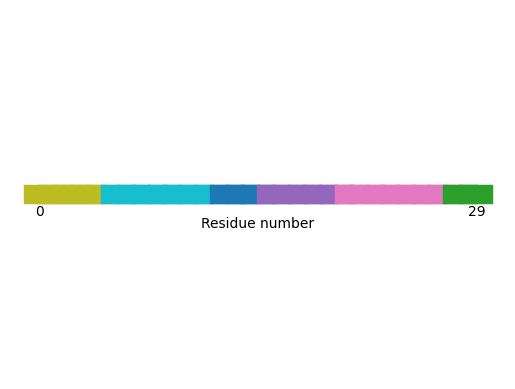

In [127]:
visualizations.plot_residue_line_plus_noise(residue_items, result_hdbscan_2_2.labels_)

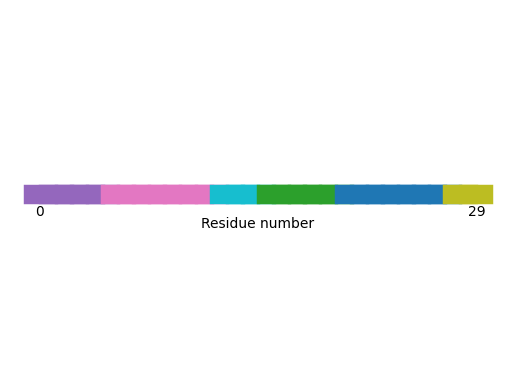

In [128]:
visualizations.plot_residue_line_plus_noise(residue_items, result_hdbscan_2_2_flat.labels_)

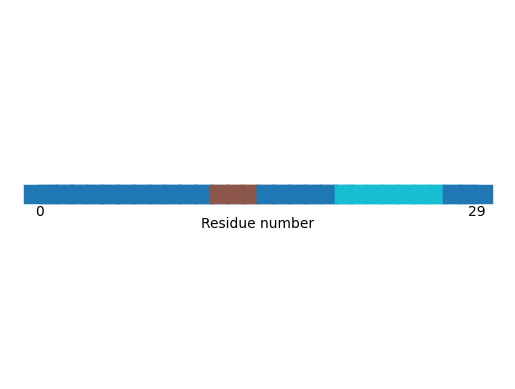

In [129]:
visualizations.plot_residue_line_plus_noise(residue_items, result_spectral_3.labels_)

In [130]:
import sklearn 
def get_clustering_similarity_true(true_clustering, clusterings, sim_function = sklearn.metrics.adjusted_rand_score):
    sim_results = []
    for i in range(len(clusterings)):
        sim_result = sim_function(true_clustering, clusterings[i])
        sim_results.append(sim_result)
    return sim_results

def get_clustering_similarity_true_trajectories(true_clusterings, clusterings, sim_function = sklearn.metrics.adjusted_rand_score):
    sim_results = []
    for i in range(len(clusterings)):
        sim_result = sim_function(true_clusterings[i], clusterings[i])
        sim_results.append(sim_result)
    return sim_result



Text(0.5, 1.0, 'adjusted rand score')

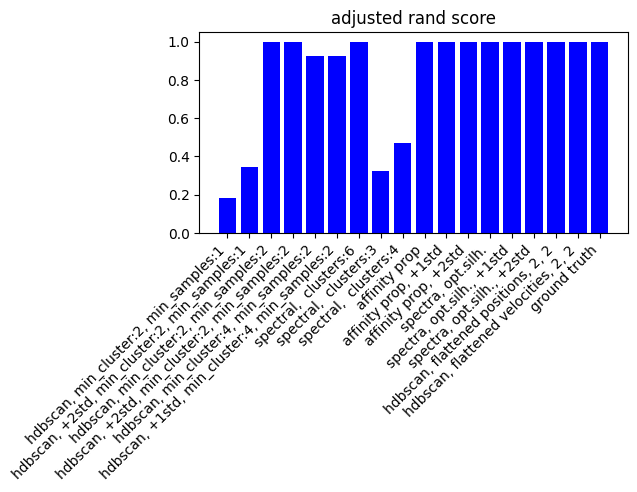

In [131]:
sim_scores = get_clustering_similarity_true(true_labels, clustering_results)
plt.bar(clustering_names, sim_scores, color='blue')
plt.xticks(rotation=45, ha='right')  

plt.tight_layout()

plt.title("adjusted rand score")

Text(0.5, 1.0, 'nr. of wrong elements')

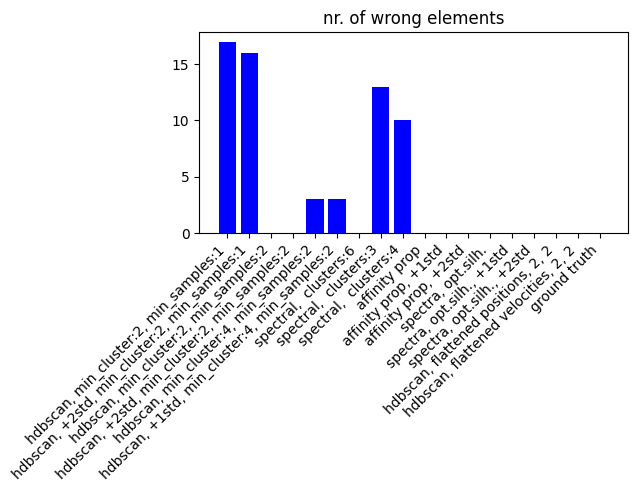

In [132]:
sim_scores = get_clustering_similarity_true(true_labels, clustering_results, evaluate_clustering_nr_wrong_elements)
plt.bar(clustering_names, sim_scores, color='blue')
plt.xticks(rotation=45, ha='right')  

plt.tight_layout()

plt.title("nr. of wrong elements")

Text(0.5, 1.0, 'NMI')

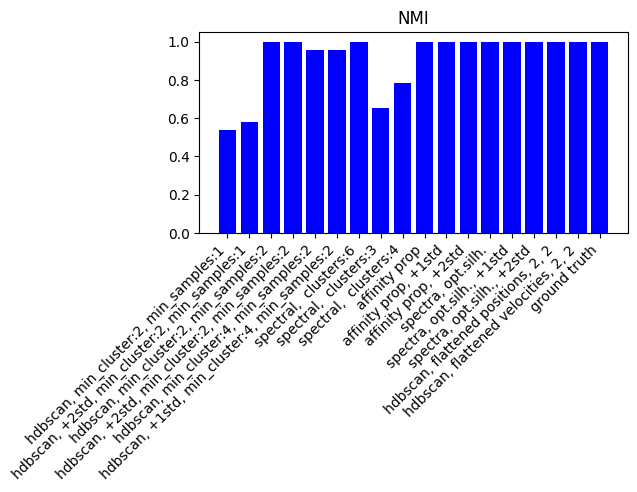

In [133]:
sim_scores = get_clustering_similarity_true(true_labels, clustering_results, sklearn.metrics.normalized_mutual_info_score)
plt.bar(clustering_names, sim_scores, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("NMI")

Text(0.5, 1.0, 'number of points class. as noise')

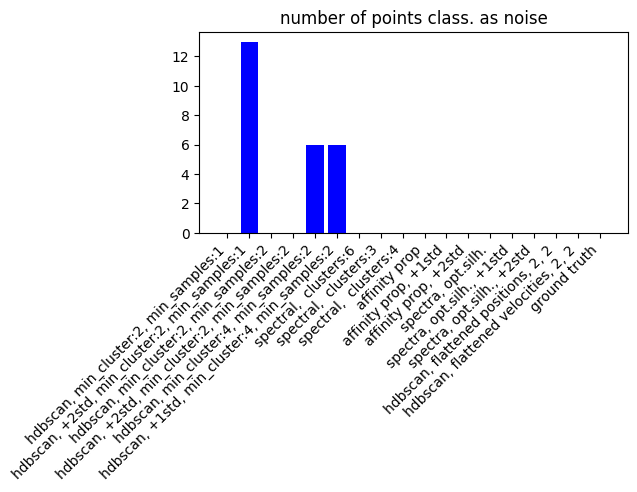

In [134]:
noise_elements = []
noise_int = -1
for res in clustering_results:
    noise_el = len(np.where(np.array(res)==noise_int)[0])
    noise_elements.append(noise_el)

plt.bar(clustering_names, noise_elements, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("number of points class. as noise")

Text(0.5, 1.0, 'number of clusters')

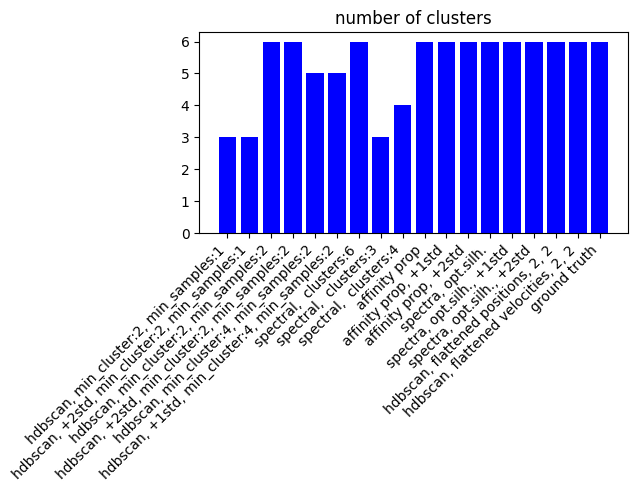

In [135]:

plt.bar(clustering_names, [len(np.unique(x)) for x in clustering_results], color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("number of clusters")

In [136]:
#Q calculations

clustering contains noise
clustering contains noise
clustering contains noise


Text(0.5, 1.0, 'Q_max from distance matrices, full, thinning=500')

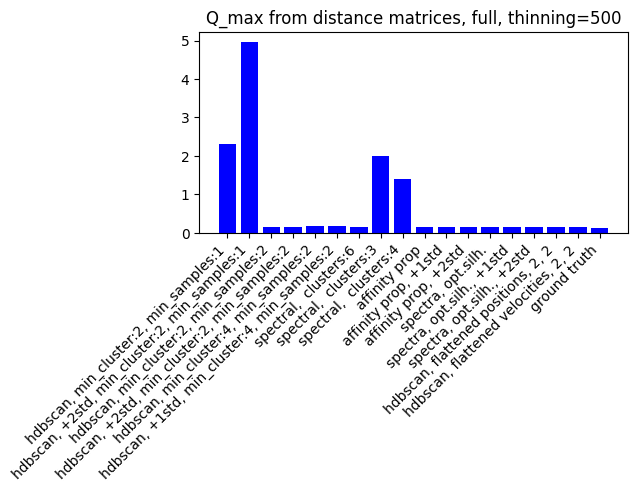

In [137]:
Qs = []
for res in clustering_results:

    new_dist_Q_max_value, _ = get_Q_for_clustering_extended(dist_matrices, np.array(res), None, use_max=True, thinning_factor=500, only_adjacent=False, reference_frame=None, return_raw=False)
    Qs.append(new_dist_Q_max_value)

plt.bar(clustering_names, Qs, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("Q_max from distance matrices, full, thinning=500")

clustering contains noise
clustering contains noise
clustering contains noise


Text(0.5, 1.0, 'Q_max from distance matrices, full, thinning=500')

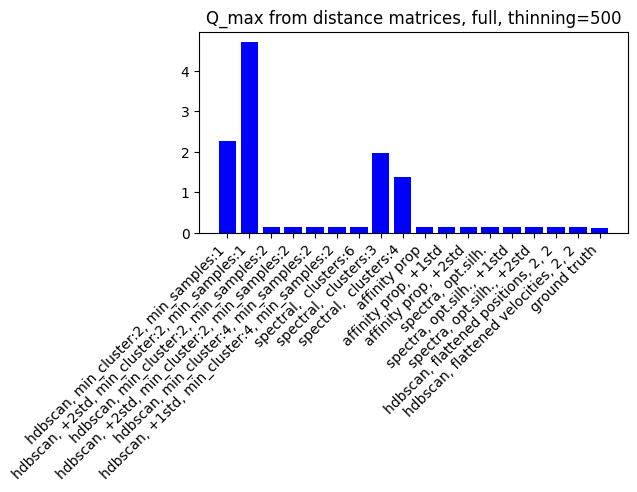

In [138]:
Qs = []
for res in clustering_results:

    new_dist_Q_max_value, _ = get_Q_for_clustering_extended(dist_matrices, np.array(res), None, use_max=True, thinning_factor=100, only_adjacent=False, reference_frame=None, return_raw=False)
    Qs.append(new_dist_Q_max_value)

plt.bar(clustering_names, Qs, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("Q_max from distance matrices, full, thinning=500")

clustering contains noise
clustering contains noise
clustering contains noise


Text(0.5, 1.0, 'Q_max from distance matrices, full')

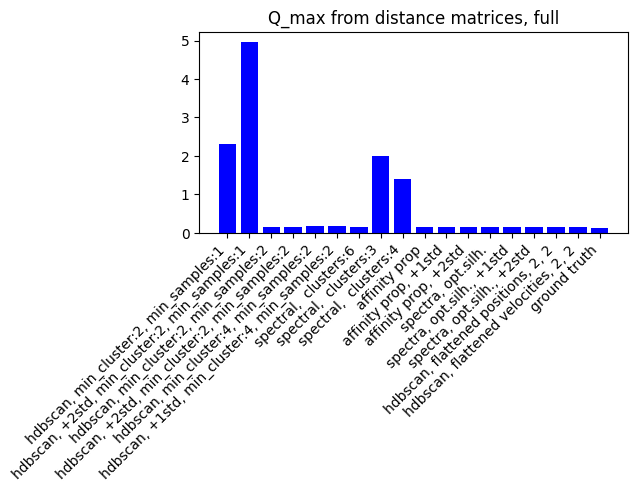

In [139]:
Qs = []
for res in clustering_results:

    new_dist_Q_max_value, _ = get_Q_for_clustering_extended(dist_matrices, np.array(res), None, use_max=True, thinning_factor=None, only_adjacent=False, reference_frame=None, return_raw=False)
    Qs.append(new_dist_Q_max_value)

plt.bar(clustering_names, Qs, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("Q_max from distance matrices, full")

clustering contains noise
clustering contains noise
clustering contains noise


Text(0.5, 1.0, 'Q_mean from distance matrices, full')

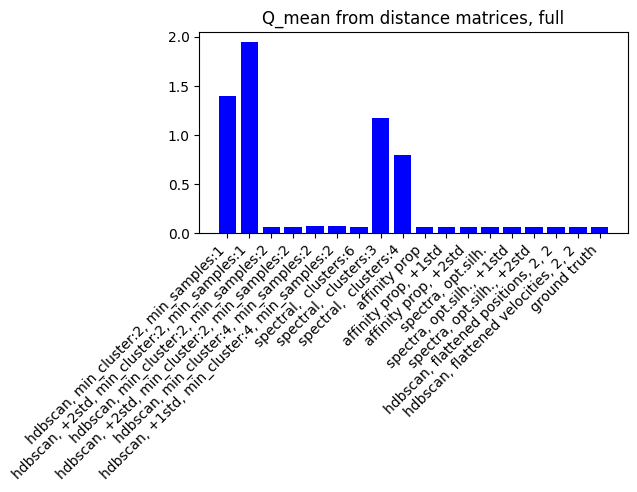

In [140]:
Qsf3= []
for res in clustering_results:

    new_dist_Q_max_value, _ = get_Q_for_clustering_extended(dist_matrices, np.array(res), None, use_max=False, thinning_factor=None, only_adjacent=False, reference_frame=None, return_raw=False)
    Qsf3.append(new_dist_Q_max_value)

plt.bar(clustering_names, Qsf3, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("Q_mean from distance matrices, full")

clustering contains noise
clustering contains noise
clustering contains noise


Text(0.5, 1.0, 'Q_max from positions, Kabsch superimposition, full, thinning=100')

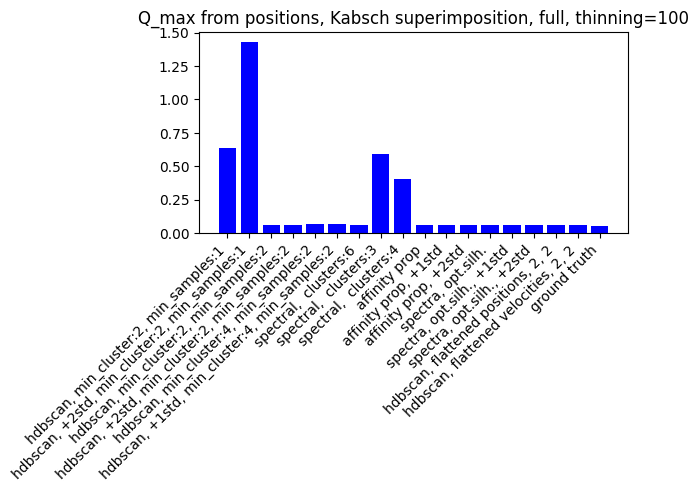

In [141]:

Qs = []

for res in clustering_results:


    new_dist_Q_max_value, _ = get_Q_for_clustering_positions(traj_array, np.array(res), None, use_max=True, apply_superimposition = "kabsch", thinning_factor=100, only_adjacent=False, reference_frame=None, return_raw=False)
    Qs.append(new_dist_Q_max_value)

plt.bar(clustering_names, Qs, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("Q_max from positions, Kabsch superimposition, full, thinning=100")

clustering contains noise
clustering contains noise
clustering contains noise


Text(0.5, 1.0, 'Q_mean from positions, Kabsch superimposition, full')

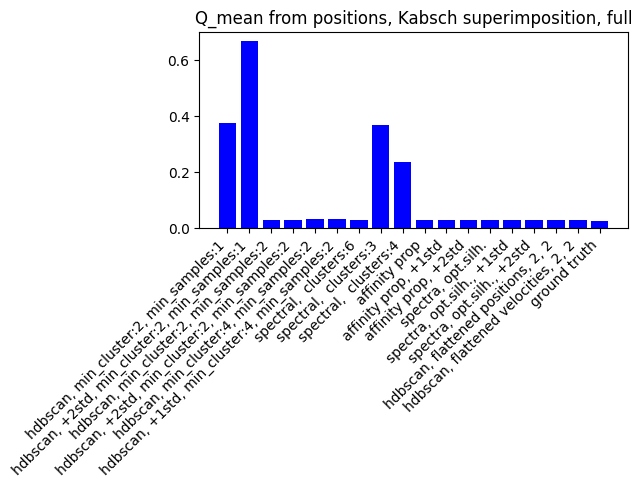

In [142]:
Qs = []

for res in clustering_results:


    new_dist_Q_max_value, _ = get_Q_for_clustering_positions(traj_array, np.array(res), None, use_max=False, apply_superimposition = "kabsch", thinning_factor=50, only_adjacent=False, reference_frame=None, return_raw=False)
    Qs.append(new_dist_Q_max_value)

plt.bar(clustering_names, Qs, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("Q_mean from positions, Kabsch superimposition, full")

In [143]:
#q computation fuer verschiedene cluster

In [144]:
import compare_clusterings
import numpy as np
from itertools import combinations

In [145]:
from compare_clusterings import *
from manipulate_trajectory import thin_trajectory

In [146]:
 clustering.labels_

array([4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 2, 2, 2, 0, 0, 0, 0, 0, 3, 3,
       3, 3, 3, 3, 3, 1, 1, 1])

In [147]:
clustering_results

[[1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  2,
  2,
  2],
 [-1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  0,
  0,
  -1,
  -1,
  -1,
  0,
  1,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1],
 [4,
  4,
  4,
  4,
  4,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  0,
  0,
  0,
  2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  1,
  1,
  1],
 [4,
  4,
  4,
  4,
  4,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  0,
  0,
  0,
  2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  1,
  1,
  1],
 [2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  -1,
  -1,
  -1,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1],
 [2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  -1,
  -1,
  -1,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1],
 [5,
  5,
  5,
  5,
  5,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  3,
  3,

In [148]:
clustering_names

['hdbscan, min_cluster:2, min_samples:1',
 'hdbscan, +2std, min_cluster:2, min_samples:1',
 'hdbscan, min_cluster:2, min_samples:2',
 'hdbscan, +2std, min_cluster:2, min_samples:2',
 'hdbscan, min_cluster:4, min_samples:2',
 'hdbscan, +1std, min_cluster:4, min_samples:2',
 'spectral,  clusters:6',
 'spectral,  clusters:3',
 'spectral,  clusters:4',
 'affinity prop',
 'affinity prop, +1std',
 'affinity prop, +2std',
 'spectra, opt.silh.',
 'spectra, opt.silh., +1std',
 'spectra, opt.silh., +2std',
 'hdbscan, flattened positions, 2, 2',
 'hdbscan, flattened velocities, 2, 2',
 'ground truth']

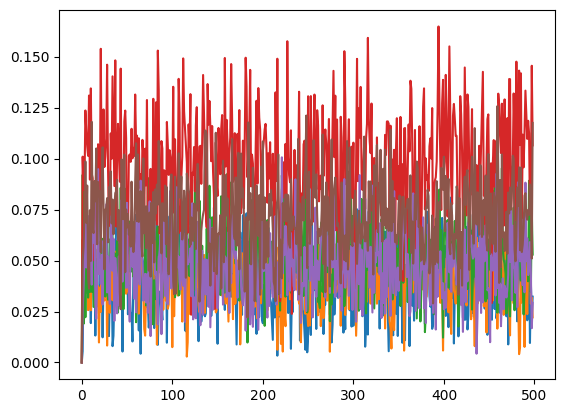

In [149]:
current_clustering = np.array(clustering_results[clustering_names.index('hdbscan, min_cluster:2, min_samples:2')])
qtraj_nosup = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=False, apply_superimposition = None, thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_center = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=True, apply_superimposition = None, thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_kabsch = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=True, apply_superimposition = "kabsch", thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_procrustes = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=True, apply_superimposition = "procrustes", thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_dist = get_Q_for_clustering_extended(dist_matrices, current_clustering, None, use_max=True, thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_dist_adj = get_Q_for_clustering_extended(dist_matrices, current_clustering, None, use_max=True, thinning_factor=None, only_adjacent=True,  return_raw=True)

for qt in qtraj_dist:
    plt.plot(qt)

In [150]:
current_clustering = np.array(clustering_results[clustering_names.index('ground truth')])

In [151]:
qtraj_nosup = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=False, apply_superimposition = None, thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_center = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=True, apply_superimposition = None, thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_kabsch = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=True, apply_superimposition = "kabsch", thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_procrustes = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=True, apply_superimposition = "procrustes", thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_dist = get_Q_for_clustering_extended(dist_matrices, current_clustering, None, use_max=True, thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_dist_adj = get_Q_for_clustering_extended(dist_matrices, current_clustering, None, use_max=True, thinning_factor=None, only_adjacent=True,  return_raw=True)



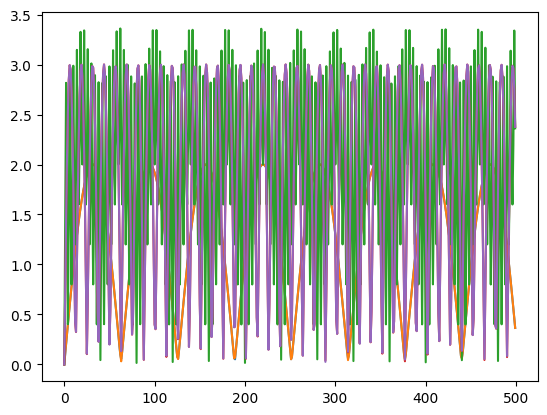

In [152]:
for qt in qtraj_nosup:
    plt.plot(qt)

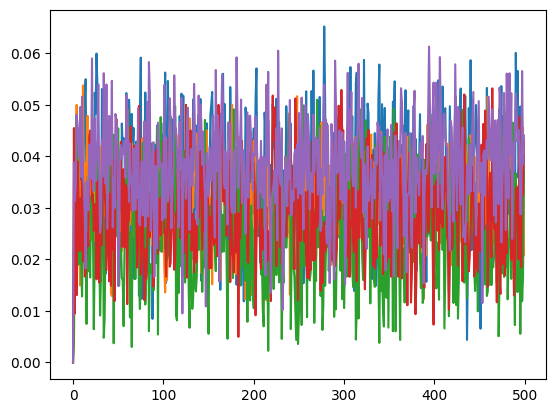

In [153]:
for qt in qtraj_center:
    plt.plot(qt)

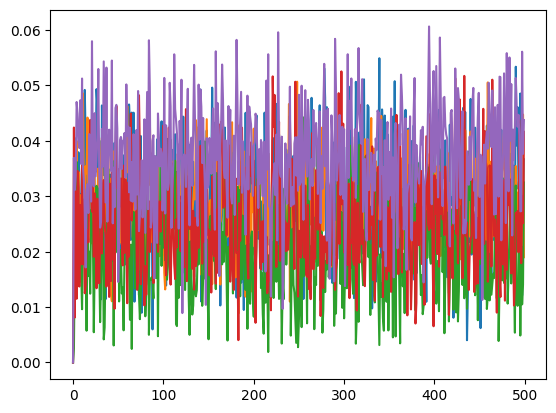

In [154]:
for qt in qtraj_kabsch:
    plt.plot(qt)

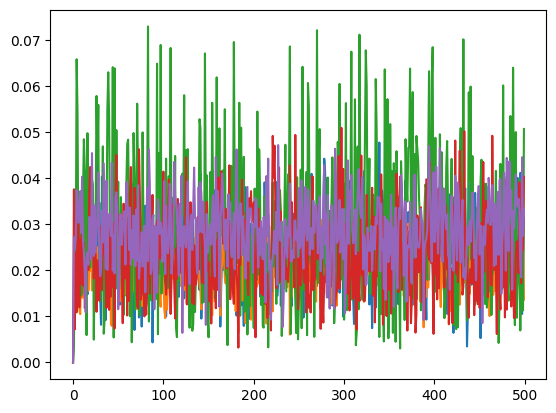

In [155]:
for qt in qtraj_procrustes:
    plt.plot(qt)

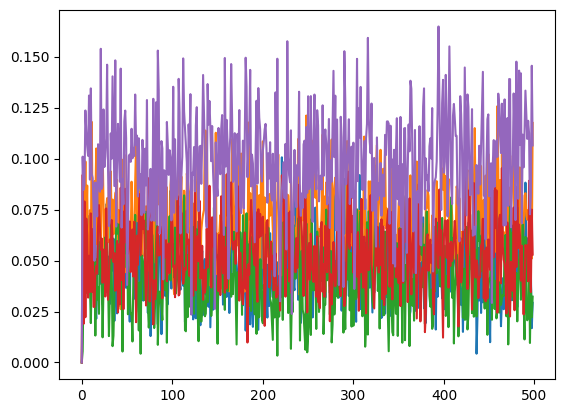

In [156]:
for qt in qtraj_dist:
    plt.plot(qt)

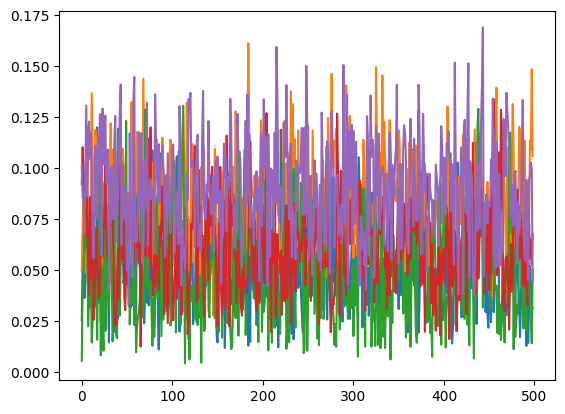

In [157]:
for qt in qtraj_dist_adj:
    plt.plot(qt)

In [158]:
clustering_results

[[1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  2,
  2,
  2],
 [-1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  0,
  0,
  -1,
  -1,
  -1,
  0,
  1,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1],
 [4,
  4,
  4,
  4,
  4,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  0,
  0,
  0,
  2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  1,
  1,
  1],
 [4,
  4,
  4,
  4,
  4,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  0,
  0,
  0,
  2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  1,
  1,
  1],
 [2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  -1,
  -1,
  -1,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1],
 [2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  -1,
  -1,
  -1,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1],
 [5,
  5,
  5,
  5,
  5,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  3,
  3,

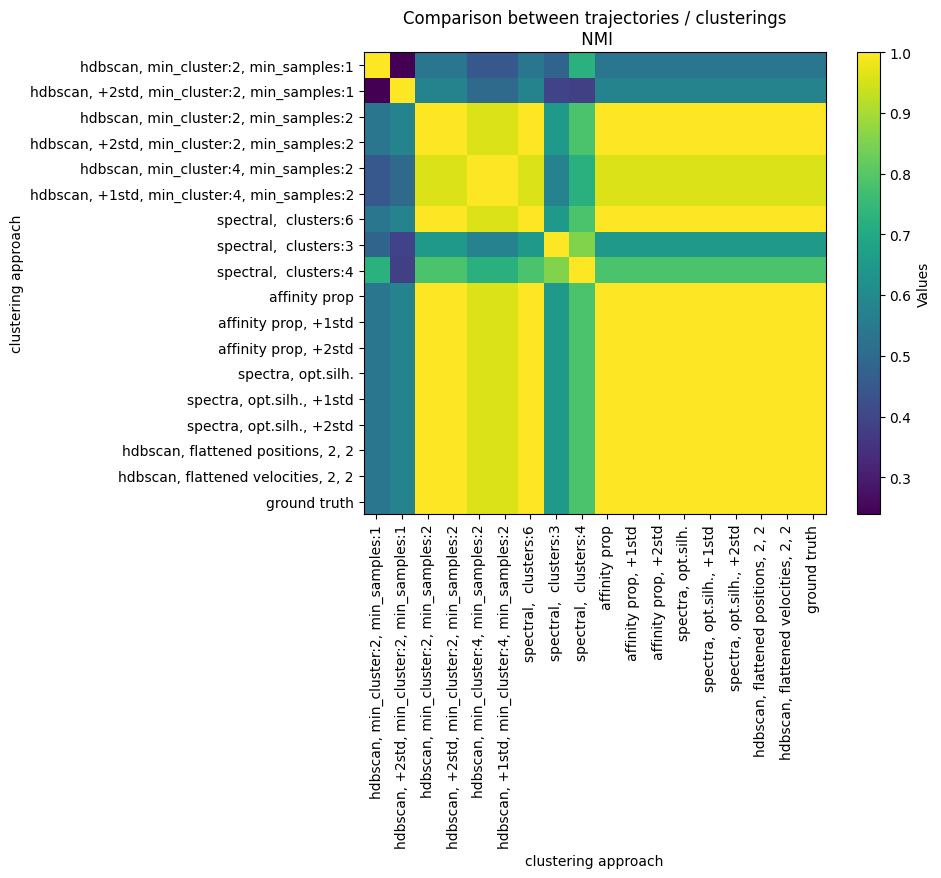

[[0, 0, 1.0],
 [0, 1, 0.23891733794098596],
 [0, 2, 0.5379200778670502],
 [0, 3, 0.5379200778670502],
 [0, 4, 0.44732573934712444],
 [0, 5, 0.44732573934712444],
 [0, 6, 0.5379200778670503],
 [0, 7, 0.4830092742017279],
 [0, 8, 0.7257711171812639],
 [0, 9, 0.5379200778670503],
 [0, 10, 0.5379200778670503],
 [0, 11, 0.5379200778670503],
 [0, 12, 0.5379200778670503],
 [0, 13, 0.5379200778670503],
 [0, 14, 0.5379200778670503],
 [0, 15, 0.5379200778670503],
 [0, 16, 0.5379200778670502],
 [0, 17, 0.5379200778670503],
 [1, 0, 0.23891733794098596],
 [1, 1, 1.0],
 [1, 2, 0.5788027421949143],
 [1, 3, 0.5788027421949143],
 [1, 4, 0.5027825478126804],
 [1, 5, 0.5027825478126804],
 [1, 6, 0.5788027421949143],
 [1, 7, 0.39107272386235514],
 [1, 8, 0.3840897123782514],
 [1, 9, 0.5788027421949143],
 [1, 10, 0.5788027421949143],
 [1, 11, 0.5788027421949143],
 [1, 12, 0.5788027421949143],
 [1, 13, 0.5788027421949143],
 [1, 14, 0.5788027421949143],
 [1, 15, 0.5788027421949143],
 [1, 16, 0.57880274219491

In [159]:
%matplotlib inline
get_trajectory_heatmap(np.array(clustering_results), np.array(clustering_results), nmi = True, create_heatmap = True, title = "Comparison between trajectories / clusterings", names=clustering_names, heatmap_label="clustering approach")

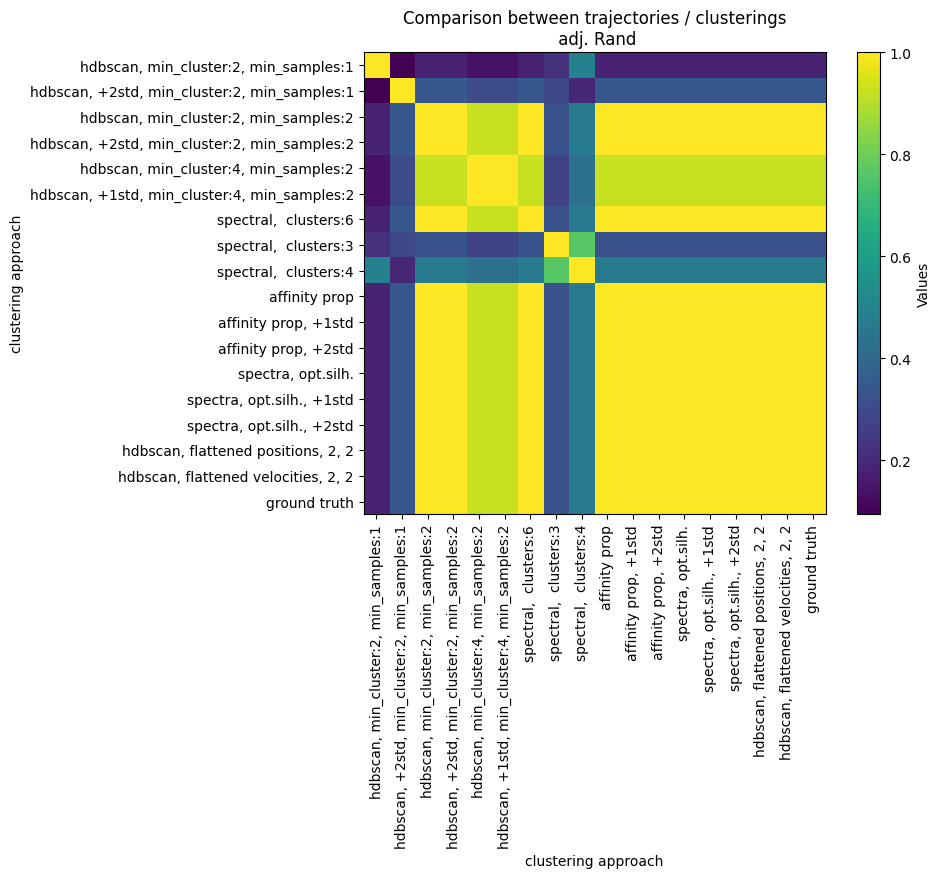

[[0, 0, 1.0],
 [0, 1, 0.0938568565027709],
 [0, 2, 0.18268977506189749],
 [0, 3, 0.18268977506189749],
 [0, 4, 0.13954602304478564],
 [0, 5, 0.13954602304478564],
 [0, 6, 0.18268977506189749],
 [0, 7, 0.22210300429184548],
 [0, 8, 0.4907175112895133],
 [0, 9, 0.18268977506189749],
 [0, 10, 0.18268977506189749],
 [0, 11, 0.18268977506189749],
 [0, 12, 0.18268977506189749],
 [0, 13, 0.18268977506189749],
 [0, 14, 0.18268977506189749],
 [0, 15, 0.18268977506189749],
 [0, 16, 0.18268977506189749],
 [0, 17, 0.18268977506189749],
 [1, 0, 0.0938568565027709],
 [1, 1, 1.0],
 [1, 2, 0.34207490579097133],
 [1, 3, 0.34207490579097133],
 [1, 4, 0.3008466532518319],
 [1, 5, 0.3008466532518319],
 [1, 6, 0.34207490579097133],
 [1, 7, 0.2890346408558329],
 [1, 8, 0.19938348971918296],
 [1, 9, 0.34207490579097133],
 [1, 10, 0.34207490579097133],
 [1, 11, 0.34207490579097133],
 [1, 12, 0.34207490579097133],
 [1, 13, 0.34207490579097133],
 [1, 14, 0.34207490579097133],
 [1, 15, 0.34207490579097133],
 [1,

In [160]:
get_trajectory_heatmap(np.array(clustering_results), np.array(clustering_results), nmi = False, create_heatmap = True, title = "Comparison between trajectories / clusterings", names=clustering_names, heatmap_label="clustering approach")

In [161]:
clustering_results

[[1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  2,
  2,
  2],
 [-1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  0,
  0,
  -1,
  -1,
  -1,
  0,
  1,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1],
 [4,
  4,
  4,
  4,
  4,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  0,
  0,
  0,
  2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  1,
  1,
  1],
 [4,
  4,
  4,
  4,
  4,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  0,
  0,
  0,
  2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  1,
  1,
  1],
 [2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  -1,
  -1,
  -1,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1],
 [2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  -1,
  -1,
  -1,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1],
 [5,
  5,
  5,
  5,
  5,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  3,
  3,

In [162]:
clustering_names

['hdbscan, min_cluster:2, min_samples:1',
 'hdbscan, +2std, min_cluster:2, min_samples:1',
 'hdbscan, min_cluster:2, min_samples:2',
 'hdbscan, +2std, min_cluster:2, min_samples:2',
 'hdbscan, min_cluster:4, min_samples:2',
 'hdbscan, +1std, min_cluster:4, min_samples:2',
 'spectral,  clusters:6',
 'spectral,  clusters:3',
 'spectral,  clusters:4',
 'affinity prop',
 'affinity prop, +1std',
 'affinity prop, +2std',
 'spectra, opt.silh.',
 'spectra, opt.silh., +1std',
 'spectra, opt.silh., +2std',
 'hdbscan, flattened positions, 2, 2',
 'hdbscan, flattened velocities, 2, 2',
 'ground truth']

In [163]:

new_plot_data = process_data.prepare_clustered_results_for_plotly(trajectories, np.array(clustering_results[clustering_names.index('spectral,  clusters:6')]))

In [164]:
%matplotlib notebook

ab_hsv = plot_functions.plot_traj_labels_plt(new_plot_data, save_video=True, interval = 10, color_map='Spectral', noise_label = -1, title = "\n spectral,  clusters:6")

<IPython.core.display.Javascript object>

In [165]:
from IPython.display import HTML
HTML(ab_hsv.to_html5_video())

In [167]:
def mix_timesteps(data):

    data = np.array(data)

    num_timesteps = data.shape[1]

    permutation = np.random.permutation(num_timesteps)

    mixed_data = data[:, permutation, :]
    
    return mixed_data


In [179]:
def thin_timesteps_randomly(data, num_timesteps):

    data = np.array(data)
    

    total_timesteps = data.shape[1]

    selected_timesteps = np.random.choice(total_timesteps, num_timesteps, replace=False)
    

    thinned_data = data[:, selected_timesteps, :]
    
    return thinned_data

In [178]:
len(trajectories[1])

500

In [168]:
trajectories

[[[1.3988166813009693, -0.1692795349955728, -0.25556992810343226, 1],
  [1.3938208465789952, -0.06944611834874465, -0.26529318696380394, 1],
  [1.3788832591422109, 0.029389795799488416, -0.2744202442462438, 1],
  [1.3541531704265752, 0.1262406716657668, -0.2911349385116695, 1],
  [1.3198776753038544, 0.22013880731307772, -0.32481361554773186, 1],
  [1.276399243191342, 0.3101460036086302, -0.2960362499199792, 1],
  [1.2241522962106475, 0.3953629383994627, -0.26709773350287114, 1],
  [1.1636588685854576, 0.4749381522421183, -0.3330791681554882, 1],
  [1.0955233906481348, 0.54807655590395, -0.3161536019921001, 1],
  [1.0204266495716336, 0.6140473746319106, -0.31007093780542283, 1],
  [0.939118987169109, 0.6721914498123237, -0.32799102782019013, 1],
  [0.8524128027265465, 0.7219278250658626, -0.24433130210925724, 1],
  [0.7611744357776427, 0.7627595509716536, -0.33726126368545045, 1],
  [0.6663155099255567, 0.7942786504216202, -0.30234304651285754, 1],
  [0.5687838242012101, 0.816170194992

In [180]:
trajectories_mixed = thin_timesteps_randomly(trajectories, 50)

In [181]:
trajectories_mixed

array([[[ 0.02822336,  0.7595157 , -0.33117578,  1.        ],
        [-0.18896613, -0.9782983 , -0.33361051,  1.        ],
        [-0.03336126,  0.73250881, -0.26183436,  1.        ],
        ...,
        [ 1.35923475, -0.44784214, -0.2698139 ,  1.        ],
        [ 0.05966182,  0.77145102, -0.28770328,  1.        ],
        [ 1.26023473, -0.67717613, -0.28667937,  1.        ]],

       [[-0.78252863,  1.08760842,  0.38317442,  1.        ],
        [-0.99971812, -0.65020558,  0.4317528 ,  1.        ],
        [-0.84411325,  1.06060153,  0.37710349,  1.        ],
        ...,
        [ 0.54848277, -0.11974942,  0.43418441,  1.        ],
        [-0.75109017,  1.09954374,  0.35592208,  1.        ],
        [ 0.44948274, -0.34908341,  0.4478093 ,  1.        ]],

       [[-0.12534499,  0.48902797,  0.38528839,  1.        ],
        [-0.34253448, -1.24878603,  0.31825869,  1.        ],
        [-0.18692961,  0.46202108,  0.30847674,  1.        ],
        ...,
        [ 1.20566641, -0.71

In [182]:
traj_array_mixed = np.array(trajectories_mixed)[:,:,:-1]
dist_matrices_mixed = redpandda_general.get_distance_matrices(traj_array_mixed)
delta_matrices_mixed = redpandda_general.get_delta_matrices(dist_matrices_mixed)
average_delta_matrix_mixed = redpandda_general.calculate_average_delta_matrix(delta_matrices_mixed)

std_delta_matrix_mixed = redpandda_general.get_std_matrices(dist_matrices_mixed)

In [183]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2, metric='precomputed') 


result = clustering.fit(average_delta_matrix.astype(np.float64))

print(result.labels_)

[4 4 4 4 4 5 5 5 5 5 5 5 0 0 0 2 2 2 2 2 3 3 3 3 3 3 3 1 1 1]


In [184]:
average_delta_matrix_mixed

array([[0.        , 0.07500552, 0.13881343, ..., 0.03830792, 0.27760783,
        0.19539002],
       [0.07500552, 0.        , 0.08441227, ..., 0.23588993, 0.07774632,
        0.09590911],
       [0.13881343, 0.08441227, 0.        , ..., 0.05294912, 0.26017445,
        0.22256351],
       ...,
       [0.03830792, 0.23588993, 0.05294912, ..., 0.        , 0.07604382,
        0.07526048],
       [0.27760783, 0.07774632, 0.26017445, ..., 0.07604382, 0.        ,
        0.06667951],
       [0.19539002, 0.09590911, 0.22256351, ..., 0.07526048, 0.06667951,
        0.        ]])

In [189]:
traj_array.shape

(30, 500, 3)

In [188]:
traj_array_mixed.shape

(30, 50, 3)

In [185]:
flattened_array_mixed = traj_array_mixed.reshape(traj_array_mixed.shape[0], -1)

In [187]:
flattened_array_mixed

array([[ 0.02822336,  0.7595157 , -0.33117578, ...,  1.26023473,
        -0.67717613, -0.28667937],
       [-0.78252863,  1.08760842,  0.38317442, ...,  0.44948274,
        -0.34908341,  0.4478093 ],
       [-0.12534499,  0.48902797,  0.38528839, ...,  1.10666639,
        -0.94766386,  0.38929353],
       ...,
       [-0.80363215,  0.99241377, -0.80670497, ...,  0.19636785,
         0.59241377,  1.18305936],
       [-0.69241396,  0.67789074, -0.86830717, ...,  0.30758604,
         0.27789074,  1.10792191],
       [-0.98413075,  0.8111956 , -0.76182404, ...,  0.01586925,
         0.4111956 ,  1.23137727]])

In [193]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2) 


result = clustering.fit(flattened_array_mixed.astype(np.float64))

print(result.labels_)

[2 2 2 2 2 3 3 3 3 3 3 3 5 5 5 0 0 0 0 0 1 1 1 1 1 1 1 4 4 4]


In [191]:
flattened_array.shape

(30, 1500)

In [192]:
flattened_array_mixed.shape

(30, 150)